## Summer 2020
### Irem Nesli Erez

#### Setting the environment:

In [1]:
import os 
import numpy as np
import math
import scipy.special
import scipy.stats
import scipy.constants

import matplotlib as mpl
import matplotlib.pyplot as plt
from astropy.table import Table
from astropy.io import fits

path = '/global/homes/i/ineslie/myhack/'
os.chdir(path)

#### Reading the DR14 eBOSS Stripe 82 Data:

In [2]:
fname=path+'/Catalogs/DR14Q_S82.fits'
c=fits.open(fname)
c

[<astropy.io.fits.hdu.image.PrimaryHDU object at 0x2aaad81f4750>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x2aaad822cf50>]

In [3]:
h=c[0] 
h.header

SIMPLE  =                    T / Standard FITS format                           
BITPIX  =                    8 / Character data                                 
NAXIS   =                    1 / Text string                                    
NAXIS1  =                 7055 / Number of characters                           
EXTEND  =                    T / There are standard extensions                  
VOTMETA =                    T / Table metadata in VOTable format               
COMMENT                                                                         
COMMENT The data in this primary HDU consists of bytes which                    
COMMENT comprise a VOTABLE document.                                            
COMMENT The VOTable describes the metadata of the table contained               
COMMENT in the following BINTABLE extension.                                    
COMMENT Such a BINTABLE extension can be used on its own as a perfectly         
COMMENT good table, but the 

In [4]:
h.data
print(h.data)

[ 60  63 120 ...  69  62  10]


In [5]:
h=c[1] 
#h.header

In [6]:
hdata=Table(h.data)

In [7]:
RA=h.data['RA']
DEC=h.data['DEC']

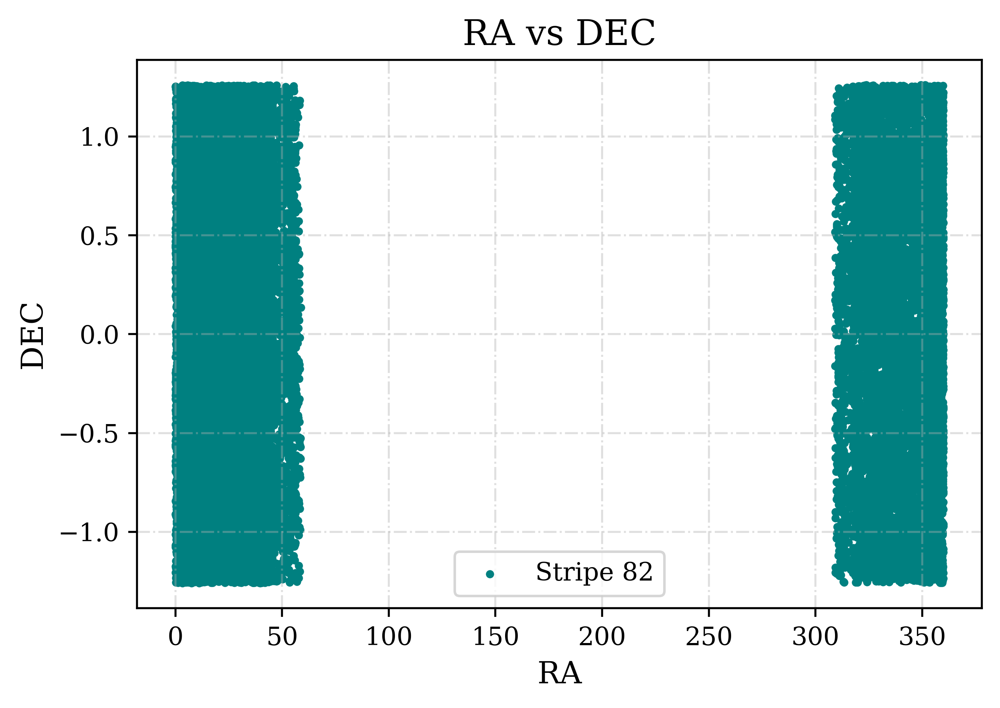

In [8]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'RA vs DEC',fontsize=14)
plt.xlabel(r'RA',fontsize=12)
plt.ylabel(r'DEC',fontsize=12)
plt.scatter(RA,DEC, color='teal', s=5, label='Stripe 82')
#props = dict(boxstyle='round', facecolor='pink', alpha=0.5)
#plt.text(0.55,20 , '$H_{0}=$'+str(H_0*1e6)+'$\, km/sMpc$', bbox=props, fontsize=6)
plt.legend();
plt.show()

for i in range(len(hdata)):
    if RA[i]>=180:
        hdata['RA'][i]=RA[i]-360
        RA[i]=RA[i]-360

In [9]:
RA=np.where(RA>=180,RA-360,RA)
hdata['RA']=np.where(hdata['RA']>=180,hdata['RA']-360,hdata['RA'])

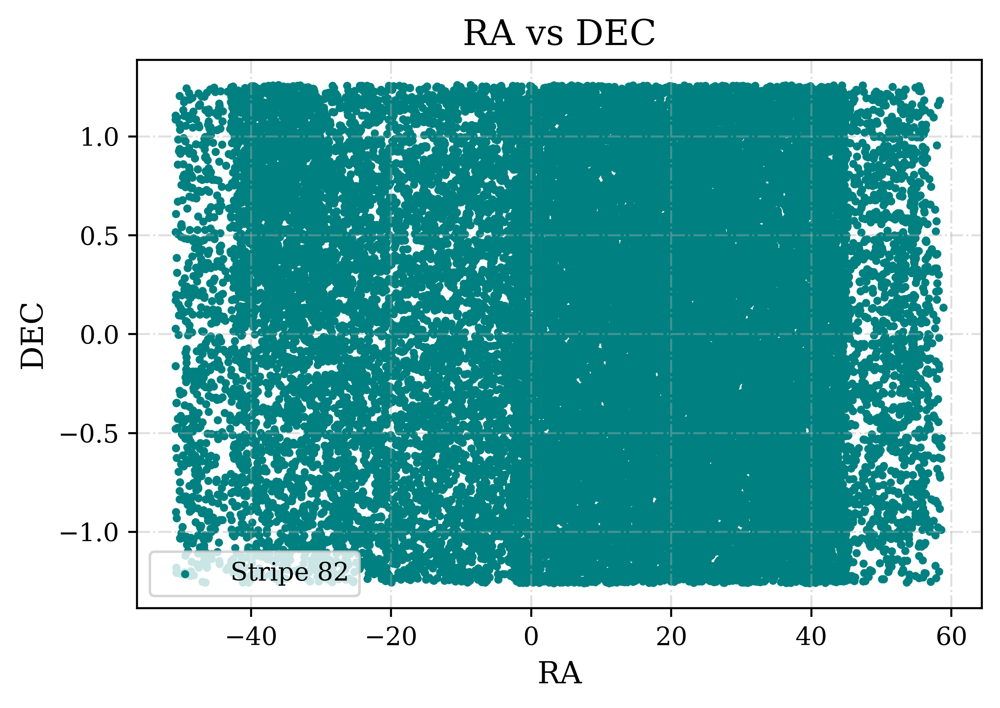

In [10]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'RA vs DEC',fontsize=14)
plt.xlabel(r'RA',fontsize=12)
plt.ylabel(r'DEC',fontsize=12)
plt.scatter(RA,DEC, color='teal', s=5, label='Stripe 82')
#props = dict(boxstyle='round', facecolor='pink', alpha=0.5)
#plt.text(0.55,20 , '$H_{0}=$'+str(H_0*1e6)+'$\, km/sMpc$', bbox=props, fontsize=6)
plt.legend();
plt.show()

In [11]:
Z=h.data['Z']

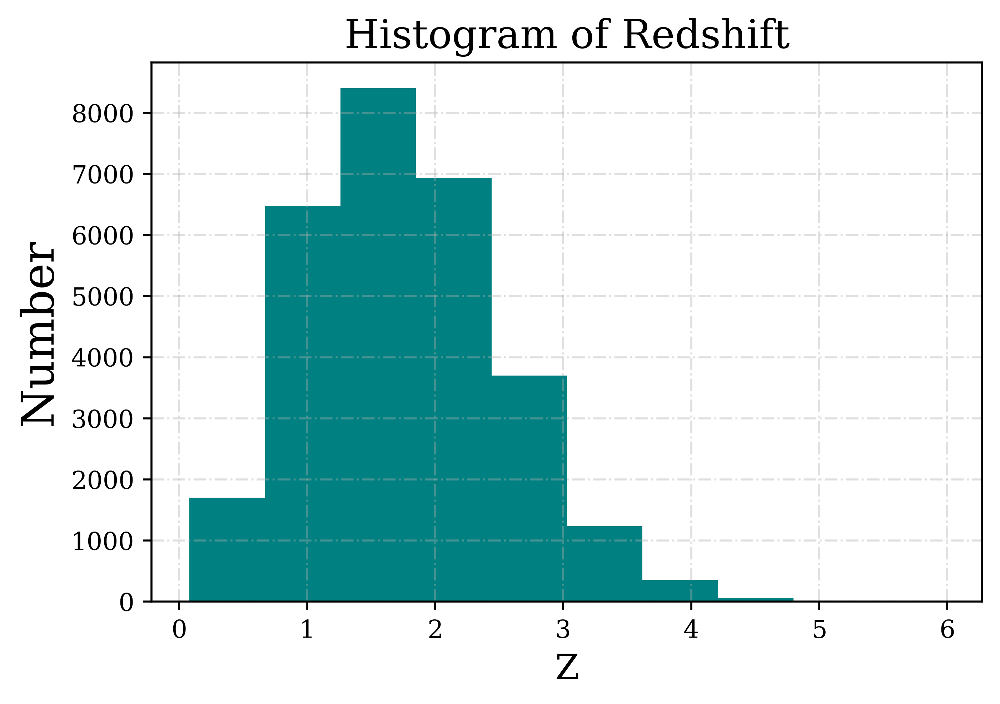

In [12]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of Redshift',fontsize=16)
plt.xlabel(r'Z',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(Z, color='teal')

plt.show()

In [13]:
#hdata

In [14]:
path_spectra='/global/project/projectdirs/cosmo/data/sdss/dr14/eboss/spectro/redux/v5_10_0/spectra/'

In [15]:
SNR_S82 = list()
SNR_S82_LyA=list()

In [16]:
for i in range(len(hdata)):
    if hdata['PLATE'][i]>3000:
        fname=path_spectra+str(hdata['PLATE'][i])+'/spec-'+str(hdata['PLATE'][i])+'-'+str(hdata['MJD'][i])+'-'+str(hdata['FIBERID'][i]).zfill(4)+'.fits'
        fits_read=fits.open(fname)
        spectra_read=Table(fits_read[1].data)
        SNR_LyA_each=fits_read[1].data['flux']*fits_read[1].data['ivar']
        SNR_S82.append(np.mean(SNR_LyA_each))
        #SNR for just the LyA forest
        lambda_obs=10**(fits_read[1].data['loglam']) #observed wavelength
        lambda_rf=lambda_obs/(hdata['Z'][i]+1)       #wavelength in the rest frame, different from reference frame
        mask_LyA=(np.logical_and(lambda_rf>1040, lambda_rf<1200))
        SNR_LyA_each_masked=SNR_LyA_each[mask_LyA]
        SNR_S82_LyA.append(np.mean(SNR_LyA_each_masked))
    else:
        SNR_S82.append(-9999)
        SNR_S82_LyA.append(-9999)

/usr/common/software/python/3.7-anaconda-2019.10/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/common/software/python/3.7-anaconda-2019.10/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


In [17]:
len(SNR_S82_LyA)

28874

In [18]:
len(hdata)

28874

In [19]:
len(SNR_S82)

28874

In [20]:
snr=Table.Column(SNR_S82, name='SNR')
hdata.add_column(snr)

In [21]:
mask = (hdata['SNR']==-9999 )
h_mask = hdata[mask]
len(h_mask)  #DOESNT HAVE SPECTRA FOR

7154

In [22]:
snr_lya=Table.Column(SNR_S82_LyA, name='SNR_LYA')
hdata.add_column(snr_lya)

In [23]:
mask = (hdata['SNR_LYA']==-9999 )
h_mask = hdata[mask]
len(h_mask)  #DOESNT HAVE SPECTRA FOR

7154

In [24]:
len(hdata)

28874

#### Cut 1: SNR>1

In [25]:
mask = (hdata['SNR']>1 )
h_masked = hdata[mask]

In [26]:
len(h_masked)

21633

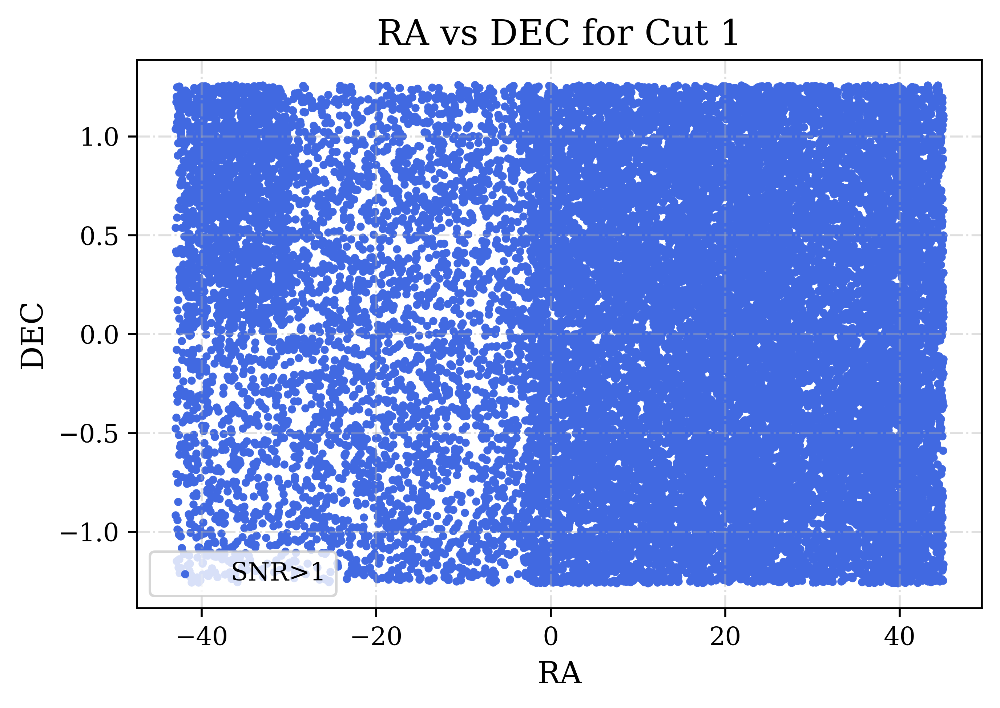

In [27]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'RA vs DEC for Cut 1',fontsize=14)
plt.xlabel(r'RA',fontsize=12)
plt.ylabel(r'DEC',fontsize=12)
plt.scatter(h_masked['RA'],h_masked['DEC'], color='royalblue', s=5, label='SNR>1')
#props = dict(boxstyle='round', facecolor='pink', alpha=0.5)
#plt.text(0.55,20 , '$H_{0}=$'+str(H_0*1e6)+'$\, km/sMpc$', bbox=props, fontsize=6)
plt.legend();
plt.show()

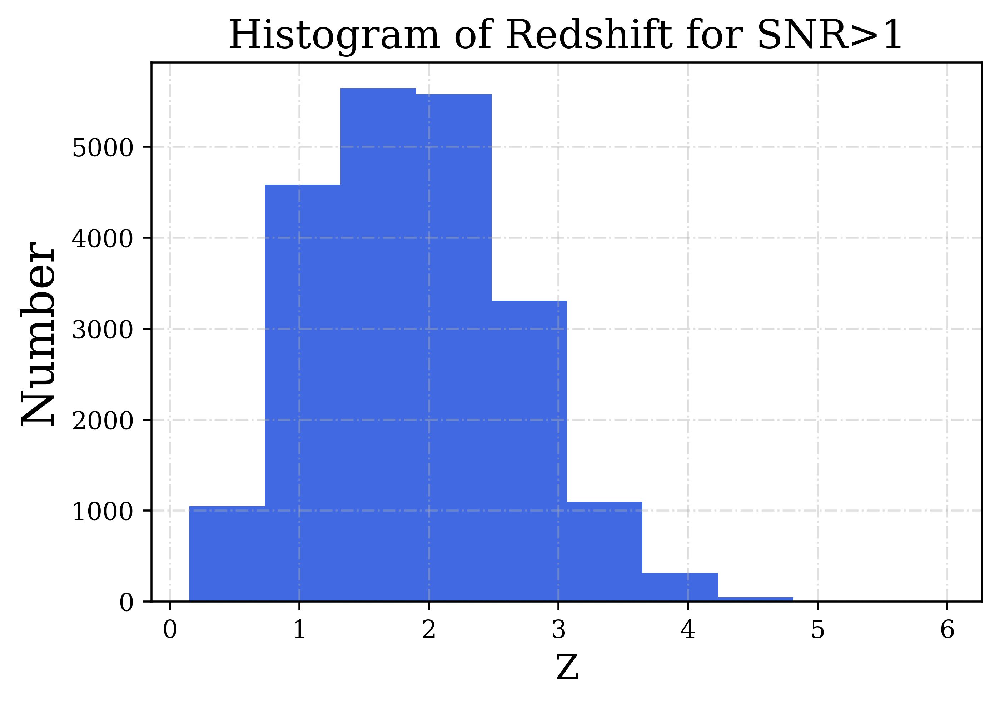

In [28]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of Redshift for SNR>1',fontsize=16)
plt.xlabel(r'Z',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(h_masked['Z'], color='royalblue')

plt.show()

In [29]:
mask = (hdata['SNR_LYA']>1 )
h_masked = hdata[mask]

/usr/common/software/python/3.7-anaconda-2019.10/lib/python3.7/site-packages/astropy/table/column.py:984: RuntimeWarning: invalid value encountered in greater
  result = getattr(super(), op)(other)


In [30]:
len(h_masked)

7072

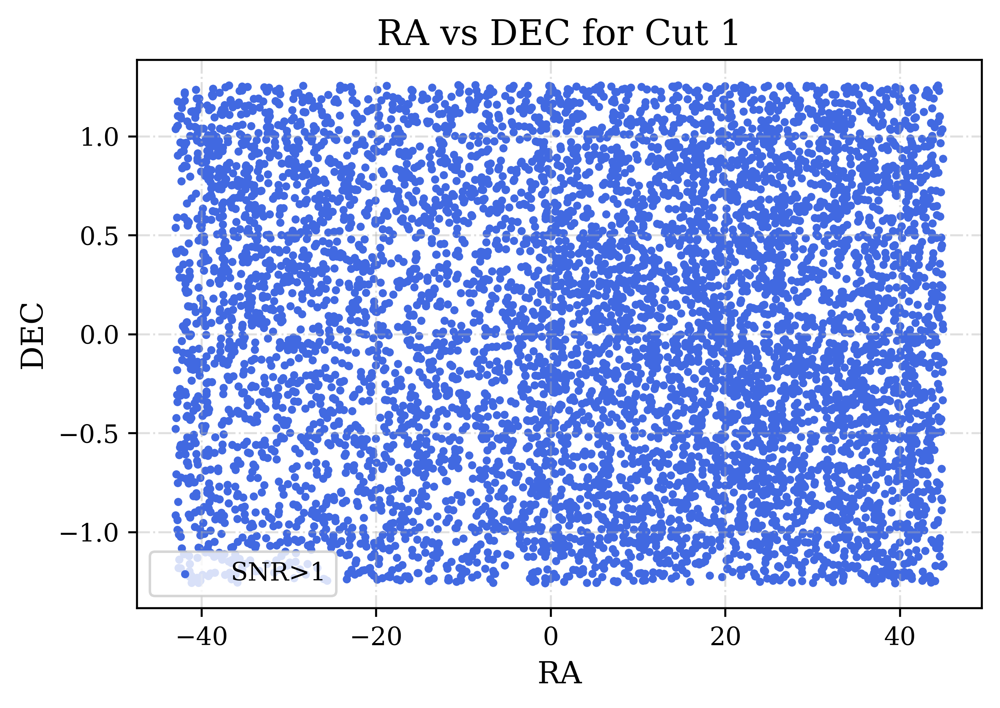

In [31]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'RA vs DEC for Cut 1',fontsize=14)
plt.xlabel(r'RA',fontsize=12)
plt.ylabel(r'DEC',fontsize=12)
plt.scatter(h_masked['RA'],h_masked['DEC'], color='royalblue', s=5, label='SNR>1')
#props = dict(boxstyle='round', facecolor='pink', alpha=0.5)
#plt.text(0.55,20 , '$H_{0}=$'+str(H_0*1e6)+'$\, km/sMpc$', bbox=props, fontsize=6)
plt.legend();
plt.show()

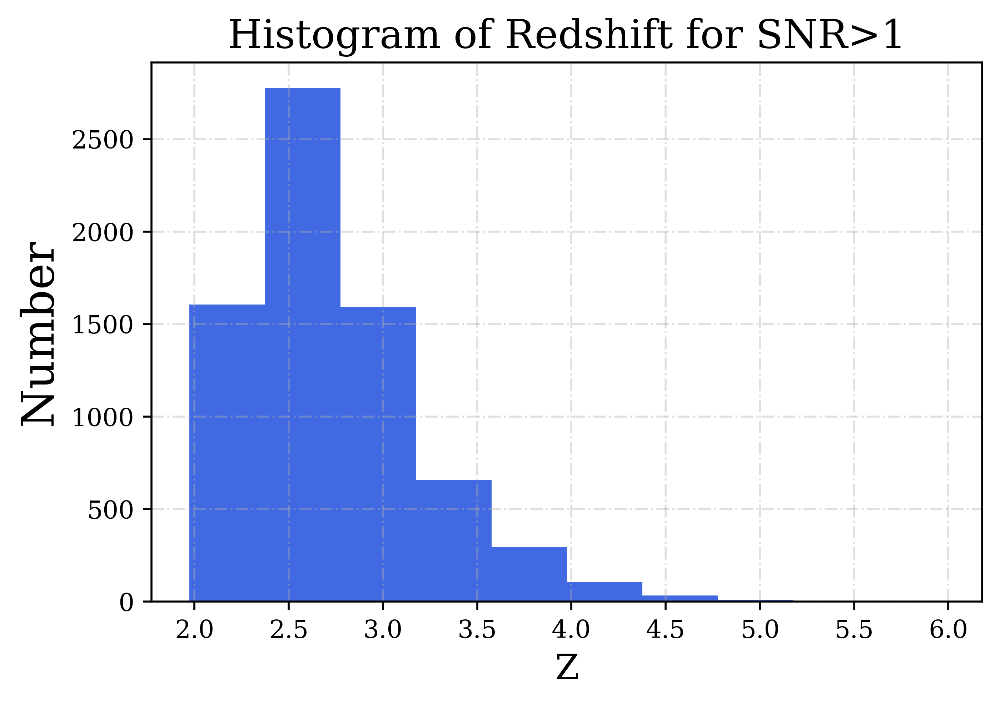

In [32]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of Redshift for SNR>1',fontsize=16)
plt.xlabel(r'Z',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(h_masked['Z'], color='royalblue')

plt.show()

#### Cut 2: SNR>2

In [33]:
mask = (hdata['SNR']>2 )
h_masked2 = hdata[mask]

In [34]:
len(h_masked2)

21104

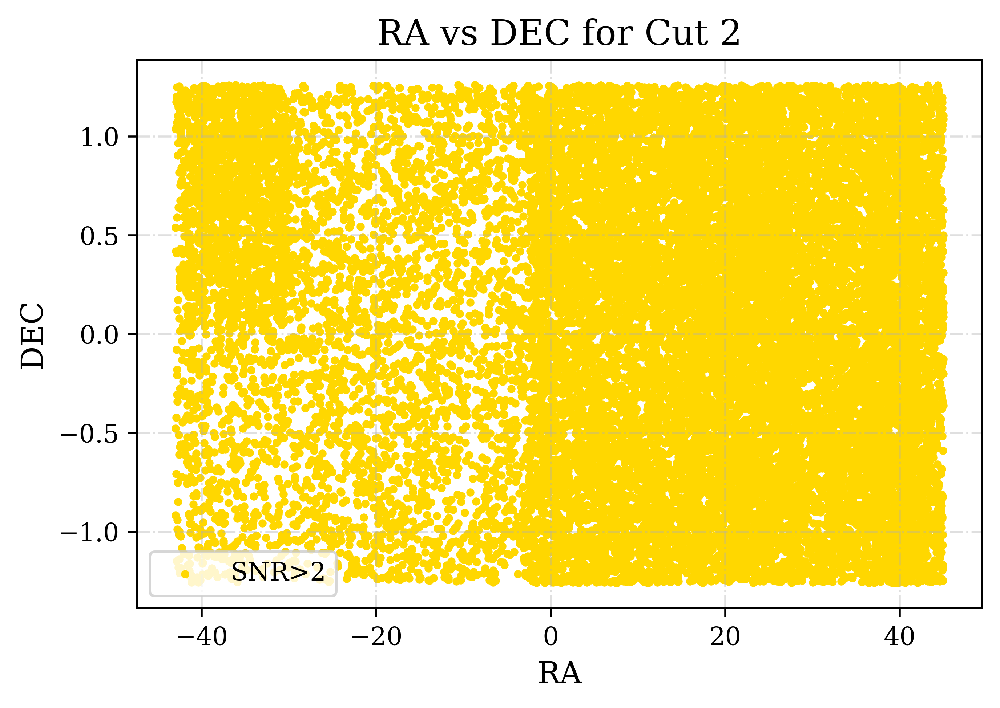

In [35]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'RA vs DEC for Cut 2',fontsize=14)
plt.xlabel(r'RA',fontsize=12)
plt.ylabel(r'DEC',fontsize=12)
plt.scatter(h_masked2['RA'],h_masked2['DEC'], color='gold', s=5, label='SNR>2')
#props = dict(boxstyle='round', facecolor='pink', alpha=0.5)
#plt.text(0.55,20 , '$H_{0}=$'+str(H_0*1e6)+'$\, km/sMpc$', bbox=props, fontsize=6)
plt.legend();
plt.show()

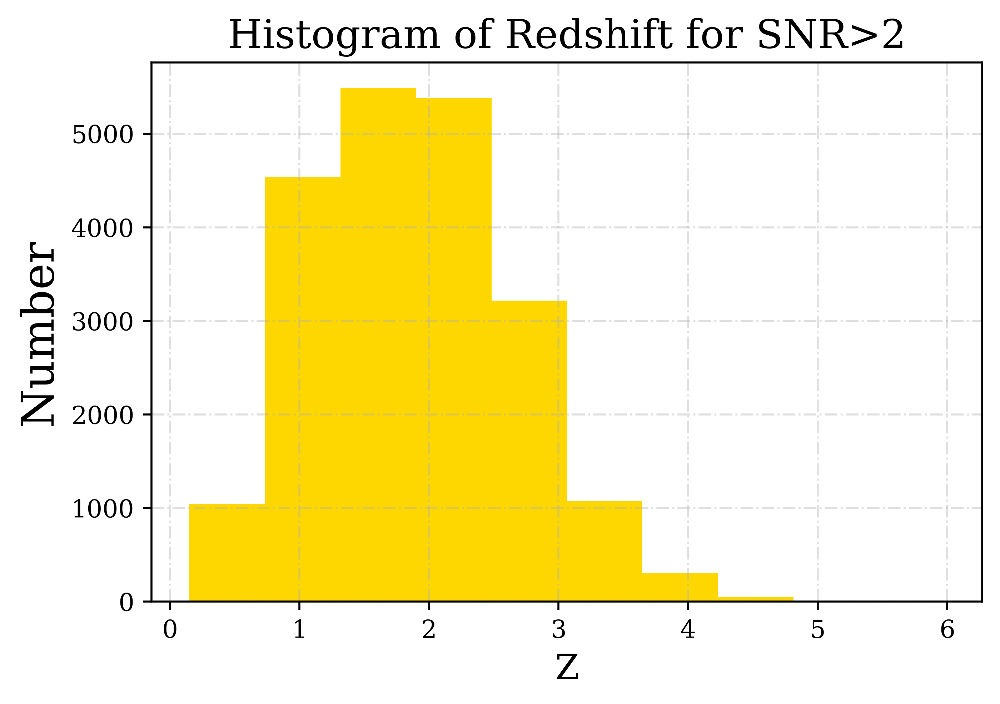

In [36]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of Redshift for SNR>2',fontsize=16)
plt.xlabel(r'Z',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(h_masked2['Z'], color='gold')

plt.show()

In [37]:
mask = (hdata['SNR_LYA']>2 )
h_masked2 = hdata[mask]

In [38]:
len(h_masked2)

5683

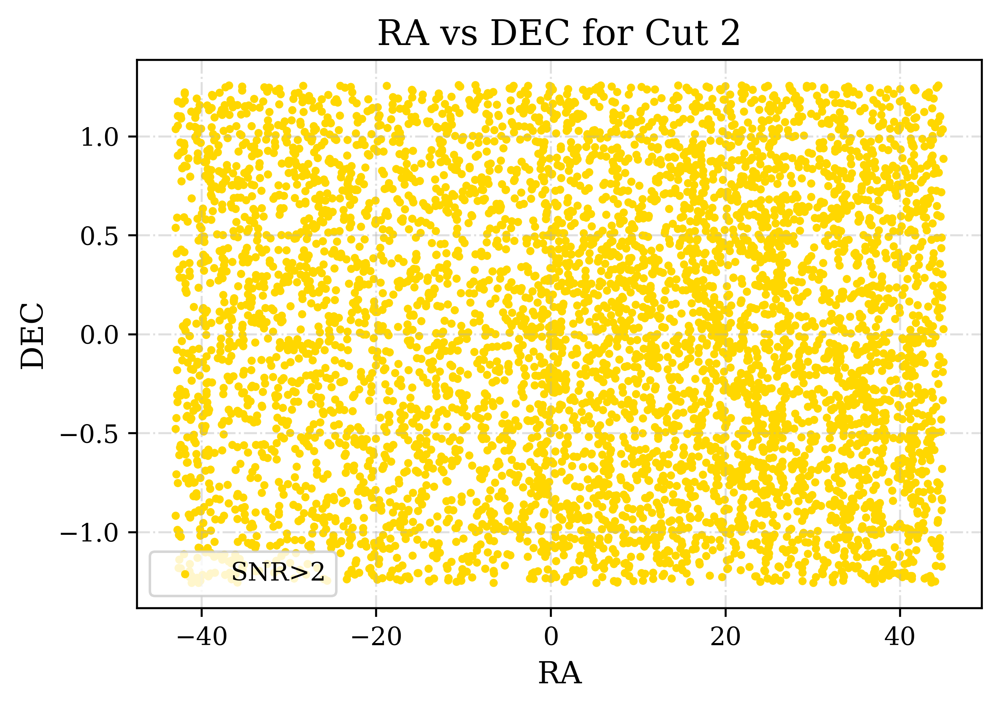

In [39]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'RA vs DEC for Cut 2',fontsize=14)
plt.xlabel(r'RA',fontsize=12)
plt.ylabel(r'DEC',fontsize=12)
plt.scatter(h_masked2['RA'],h_masked2['DEC'], color='gold', s=5, label='SNR>2')
#props = dict(boxstyle='round', facecolor='pink', alpha=0.5)
#plt.text(0.55,20 , '$H_{0}=$'+str(H_0*1e6)+'$\, km/sMpc$', bbox=props, fontsize=6)
plt.legend();
plt.show()

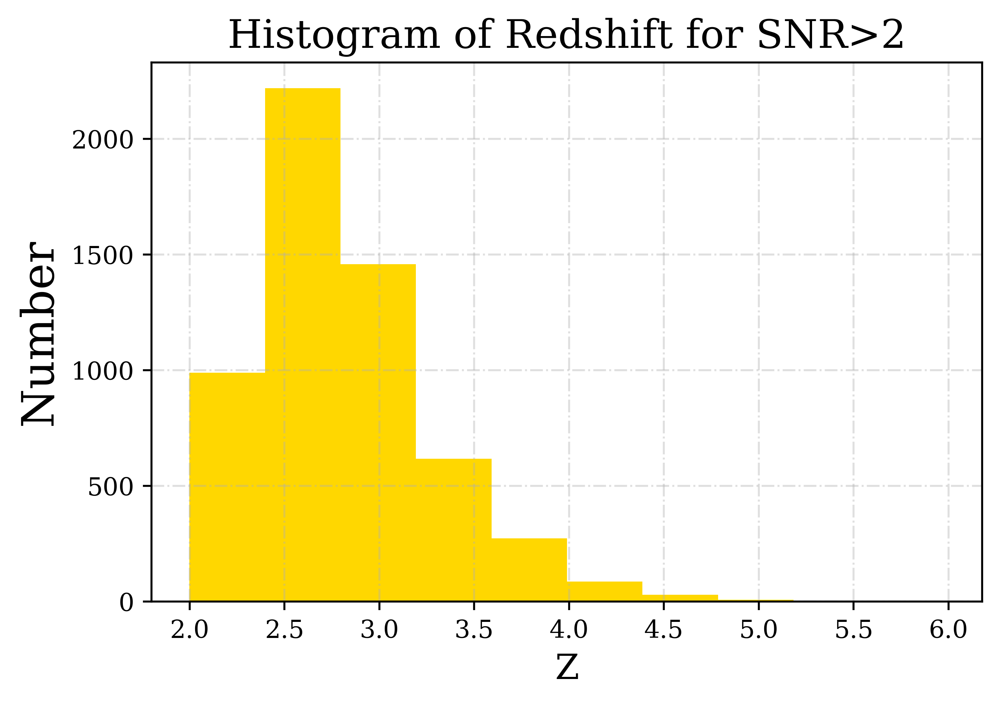

In [40]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of Redshift for SNR>2',fontsize=16)
plt.xlabel(r'Z',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(h_masked2['Z'], color='gold')

plt.show()

#### Cut 3: SNR>3

In [41]:
mask = (hdata['SNR']>3 )
h_masked3 = hdata[mask]

In [42]:
len(h_masked3)

19908

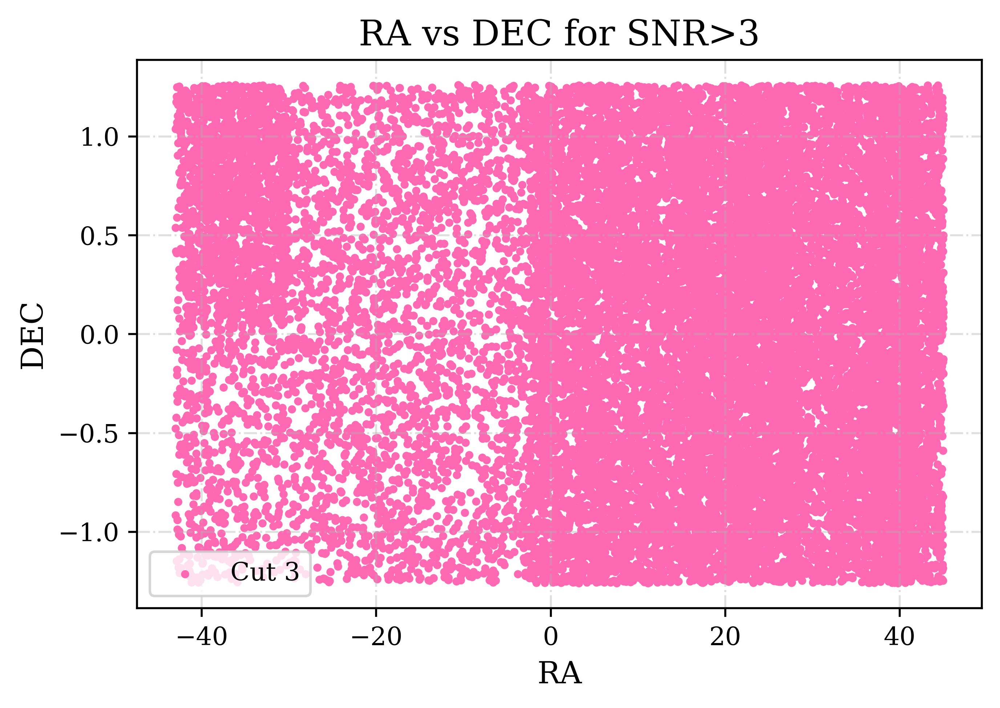

In [43]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'RA vs DEC for SNR>3',fontsize=14)
plt.xlabel(r'RA',fontsize=12)
plt.ylabel(r'DEC',fontsize=12)
plt.scatter(h_masked3['RA'],h_masked3['DEC'], color='hotpink', s=5, label='Cut 3')
#props = dict(boxstyle='round', facecolor='pink', alpha=0.5)
#plt.text(0.55,20 , '$H_{0}=$'+str(H_0*1e6)+'$\, km/sMpc$', bbox=props, fontsize=6)
plt.legend();
plt.show()

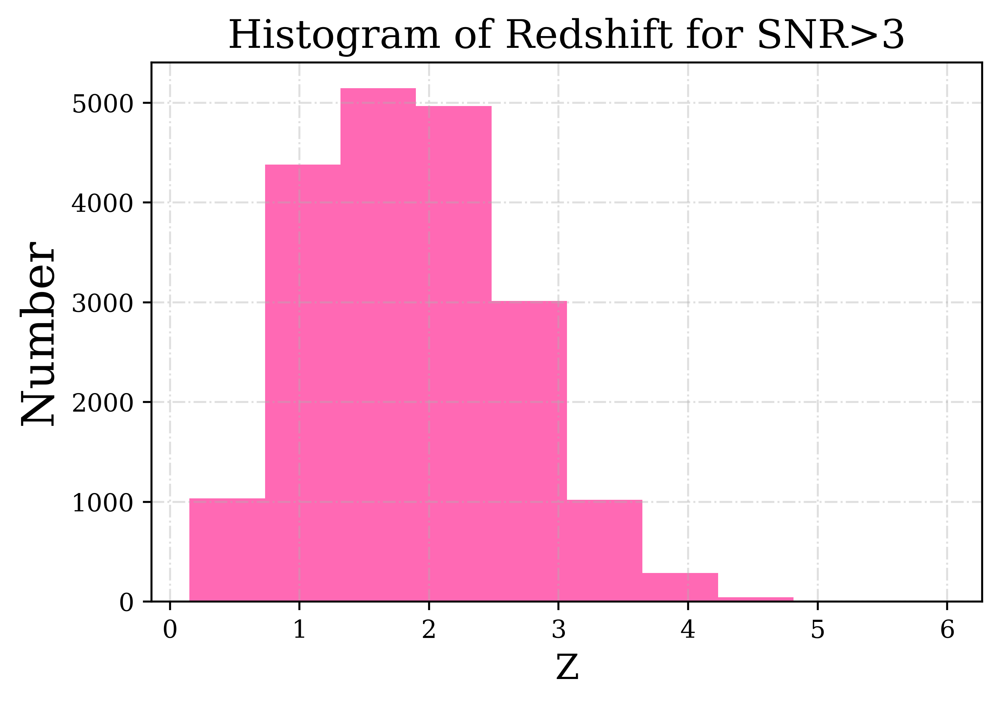

In [44]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of Redshift for SNR>3',fontsize=16)
plt.xlabel(r'Z',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(h_masked3['Z'], color='hotpink')

plt.show()

In [45]:
mask = (hdata['SNR_LYA']>3 )
h_masked3 = hdata[mask]

In [46]:
len(h_masked3)

4659

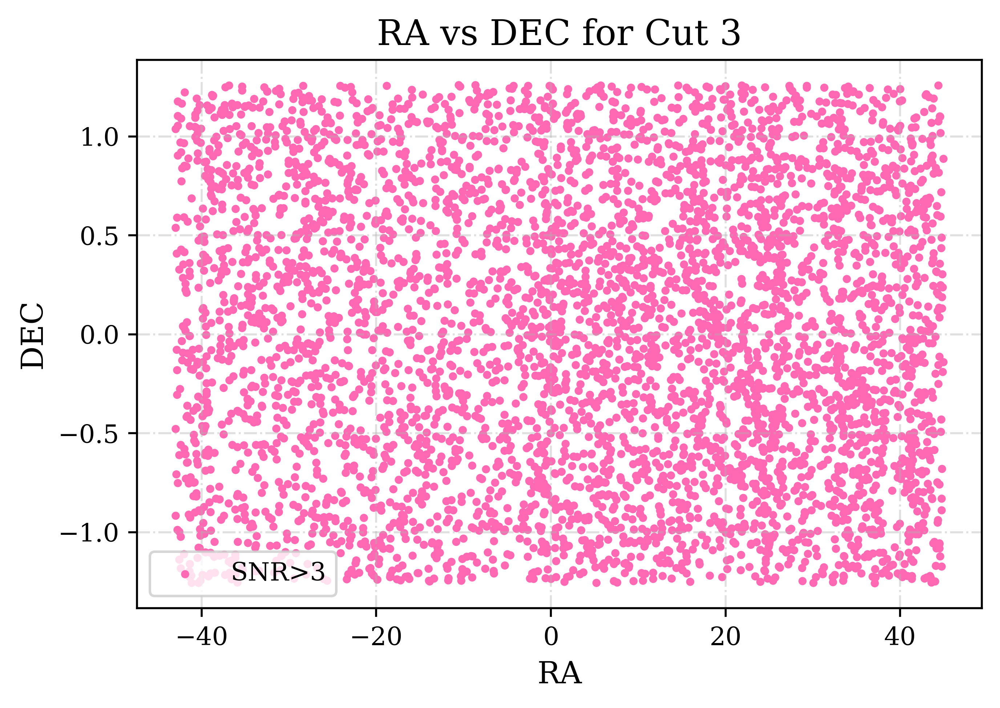

In [47]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'RA vs DEC for Cut 3',fontsize=14)
plt.xlabel(r'RA',fontsize=12)
plt.ylabel(r'DEC',fontsize=12)
plt.scatter(h_masked3['RA'],h_masked3['DEC'], color='hotpink', s=5, label='SNR>3')
#props = dict(boxstyle='round', facecolor='pink', alpha=0.5)
#plt.text(0.55,20 , '$H_{0}=$'+str(H_0*1e6)+'$\, km/sMpc$', bbox=props, fontsize=6)
plt.legend();
plt.show()

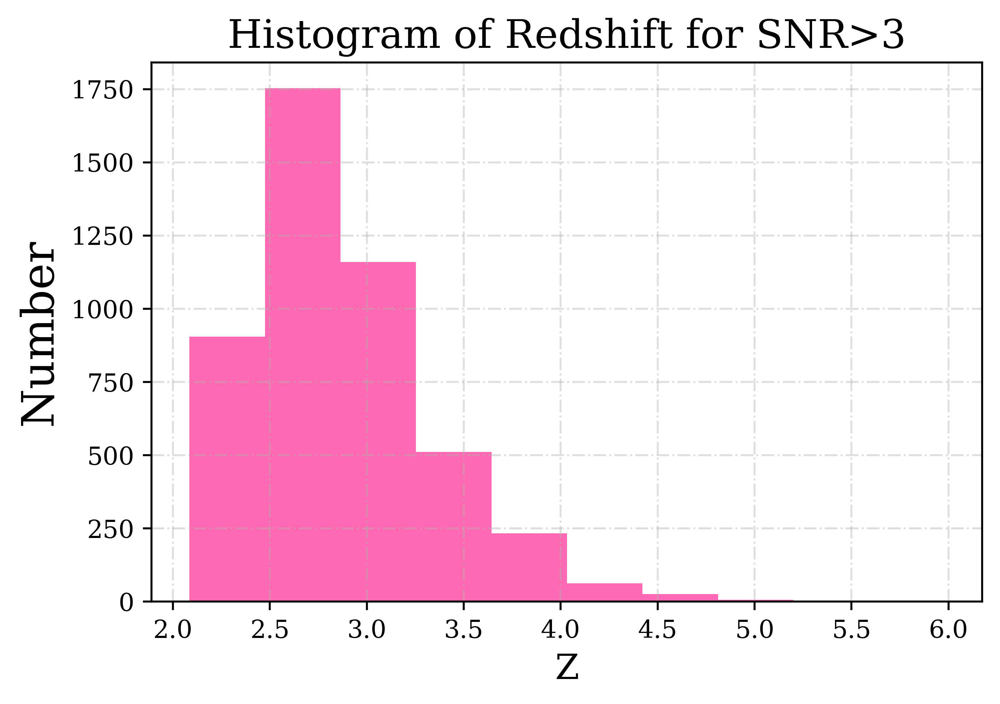

In [48]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of Redshift for SNR>3',fontsize=16)
plt.xlabel(r'Z',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(h_masked3['Z'], color='hotpink')

plt.show()

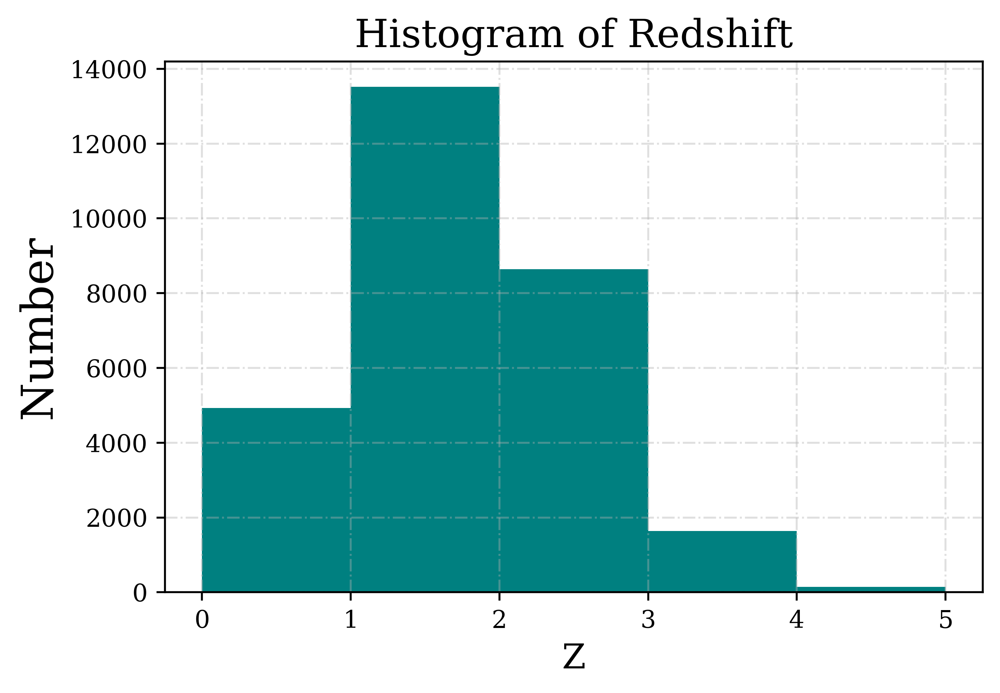

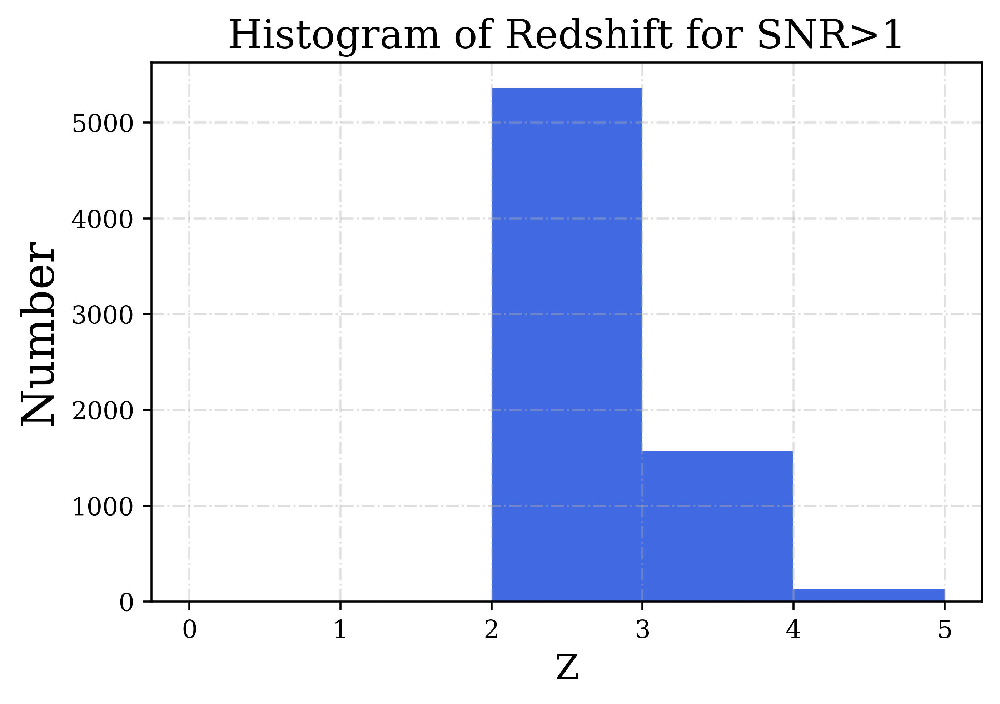

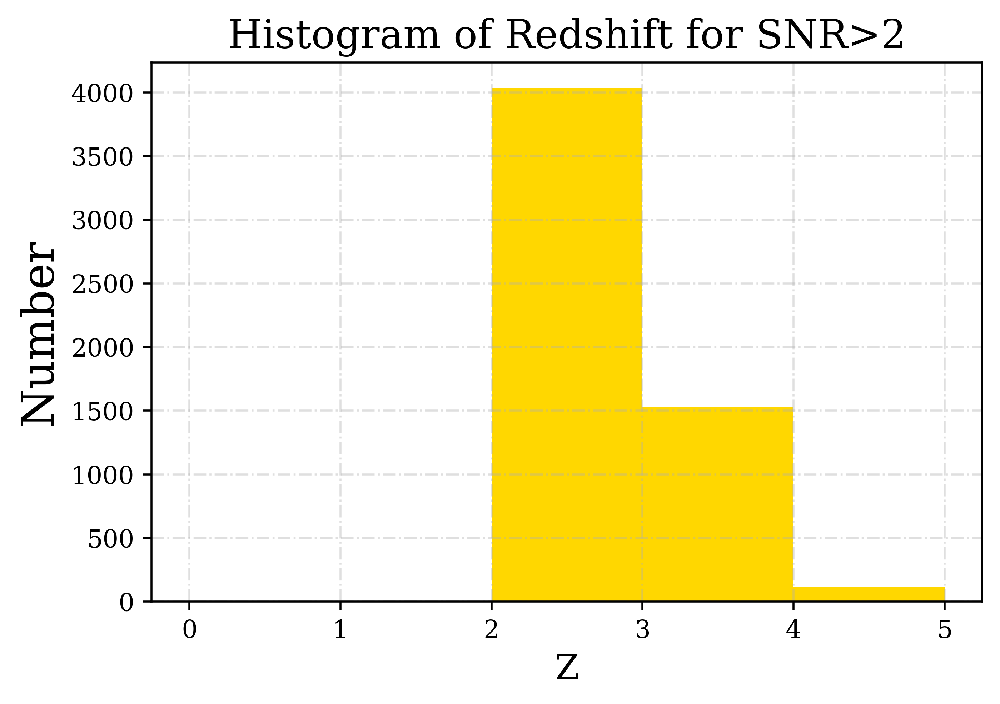

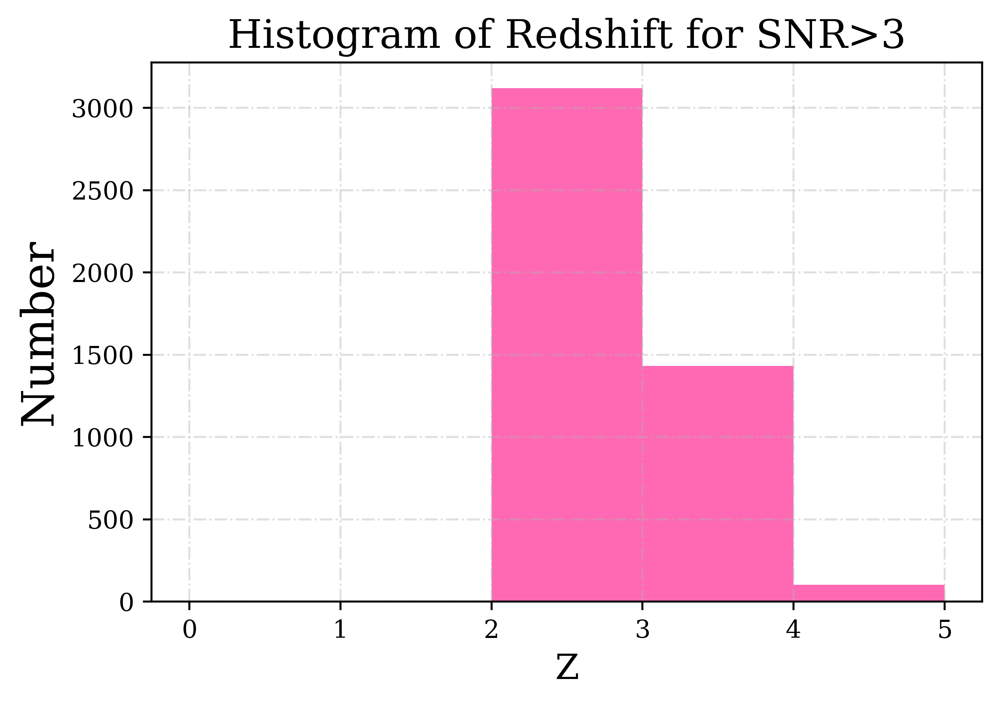

In [49]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of Redshift',fontsize=16)
plt.xlabel(r'Z',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(Z, color='teal',bins=np.arange(0,6, 1))

plt.show()

plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of Redshift for SNR>1',fontsize=16)
plt.xlabel(r'Z',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(h_masked['Z'], color='royalblue',bins=np.arange(0,6, 1))

plt.show()

plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of Redshift for SNR>2',fontsize=16)
plt.xlabel(r'Z',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(h_masked2['Z'], color='gold',bins=np.arange(0,6, 1))

plt.show()

plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of Redshift for SNR>3',fontsize=16)
plt.xlabel(r'Z',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(h_masked3['Z'], color='hotpink',bins=np.arange(0,6, 1))

plt.show()

In [50]:
len(h_masked)

7072

In [51]:
len(h_masked2)

5683

In [52]:
len(h_masked3)

4659

#### Density of quasars for each cut:

In [53]:
len(h_masked)/((max(h_masked['RA'])-min(h_masked['RA']))*(max(h_masked['DEC'])-min(h_masked['DEC'])))

31.92505587203011

In [54]:
len(h_masked2)/((max(h_masked2['RA'])-min(h_masked2['RA']))*(max(h_masked2['DEC'])-min(h_masked2['DEC'])))

25.666478085796875

In [55]:
len(h_masked3)/((max(h_masked3['RA'])-min(h_masked3['RA']))*(max(h_masked3['DEC'])-min(h_masked3['DEC'])))

21.041724687968966

Cut 2 should be chosen.

#### Histograms for SNR cuts:

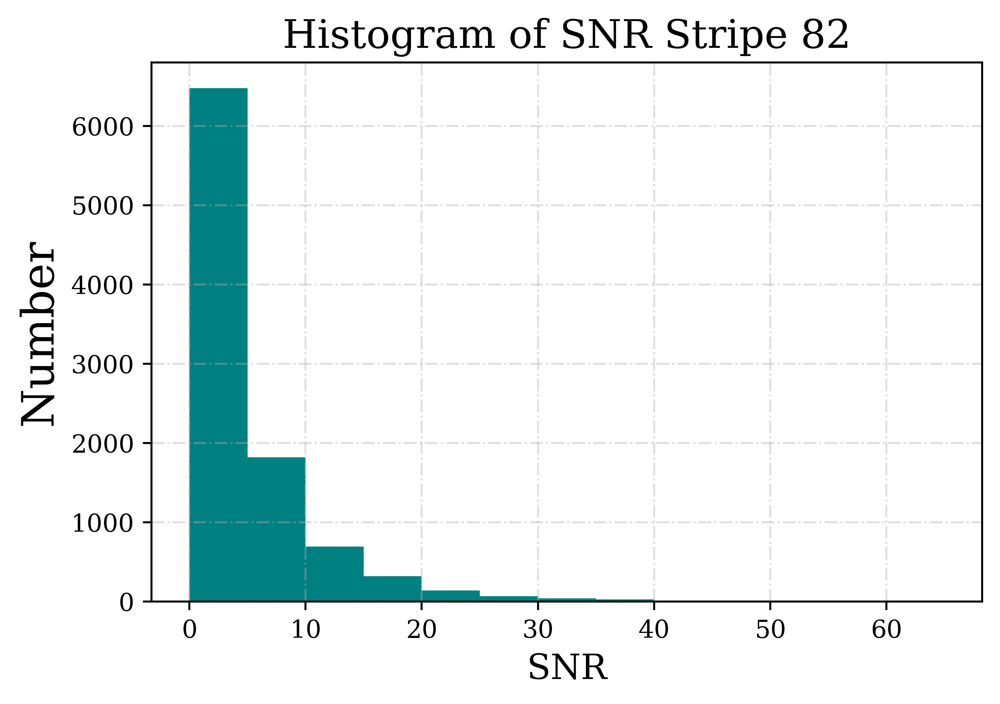

In [56]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of SNR Stripe 82',fontsize=16)
plt.xlabel(r'SNR',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(hdata['SNR_LYA'][(hdata['SNR_LYA']>-.5 )], color='teal',bins=np.arange(0,70, 5))

plt.show()

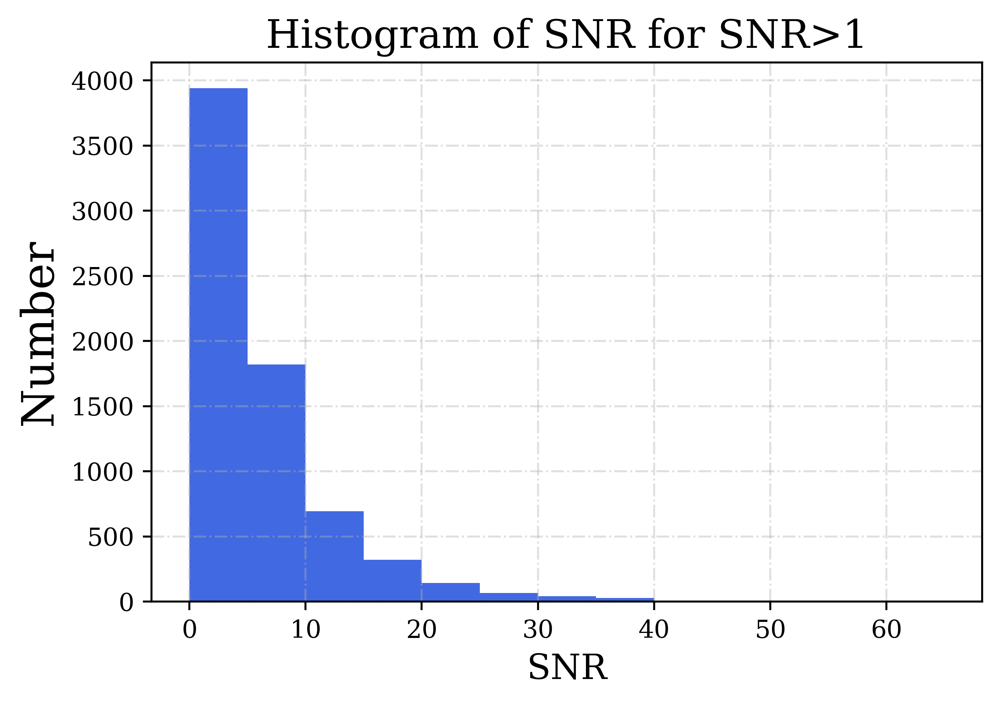

In [57]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of SNR for SNR>1',fontsize=16)
plt.xlabel(r'SNR',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(h_masked['SNR_LYA'], color='royalblue',bins=np.arange(0,70, 5))

plt.show()

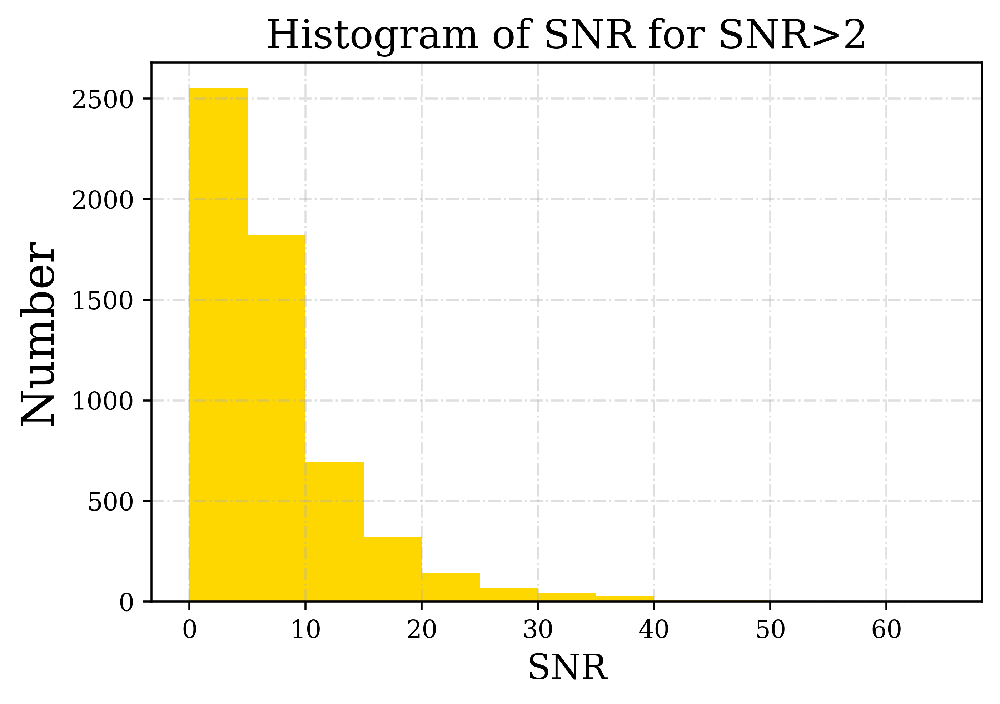

In [58]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of SNR for SNR>2',fontsize=16)
plt.xlabel(r'SNR',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(h_masked2['SNR_LYA'], color='gold',bins=np.arange(0,70, 5))

plt.show()

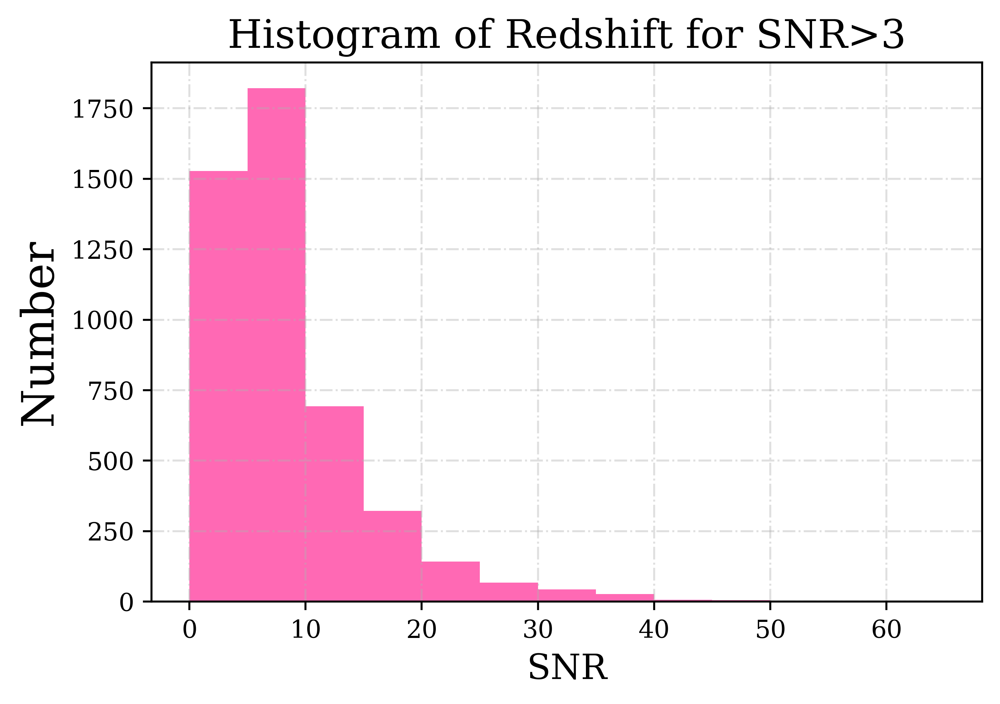

In [59]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of Redshift for SNR>3',fontsize=16)
plt.xlabel(r'SNR',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(h_masked3['SNR_LYA'], color='hotpink',bins=np.arange(0,70, 5))

plt.show()

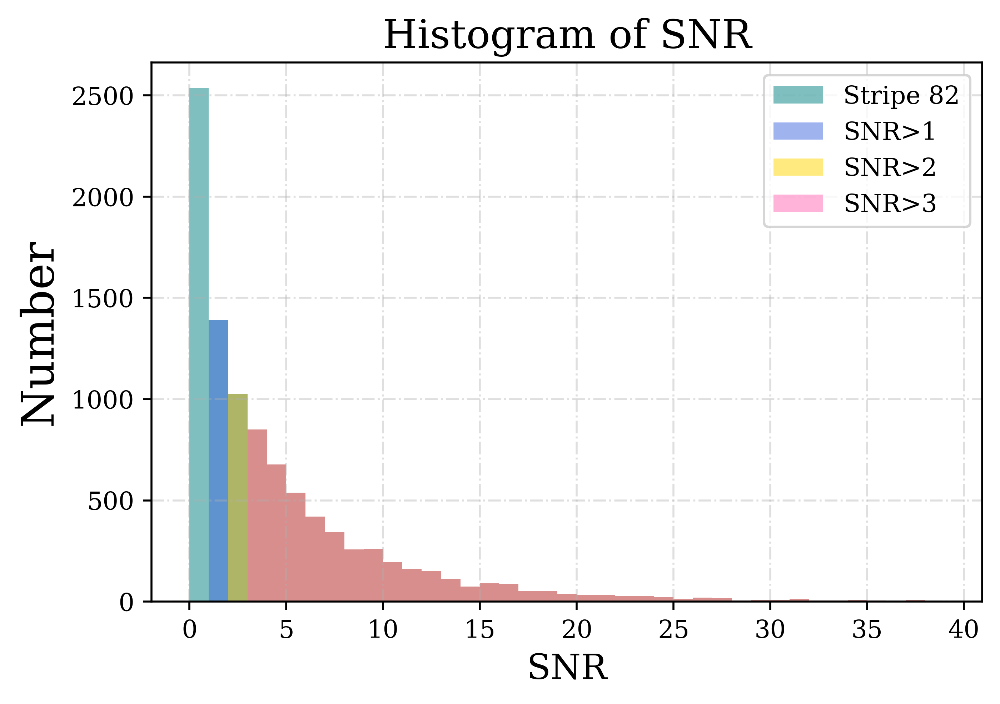

In [60]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of SNR',fontsize=16)
plt.xlabel(r'SNR',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(hdata['SNR_LYA'][(hdata['SNR_LYA']>-.5 )], color='teal',bins=np.arange(0,40, 1),alpha=0.5, label='Stripe 82')
plt.hist(h_masked['SNR_LYA'], color='royalblue',bins=np.arange(0,40, 1),alpha=0.5, label='SNR>1')
plt.hist(h_masked2['SNR_LYA'], color='gold',bins=np.arange(0,40, 1),alpha=0.5, label='SNR>2')
plt.hist(h_masked3['SNR_LYA'], color='hotpink',bins=np.arange(0,40, 1),alpha=0.5, label='SNR>3')

plt.legend()
plt.show()

#### SNR vs Z plots:

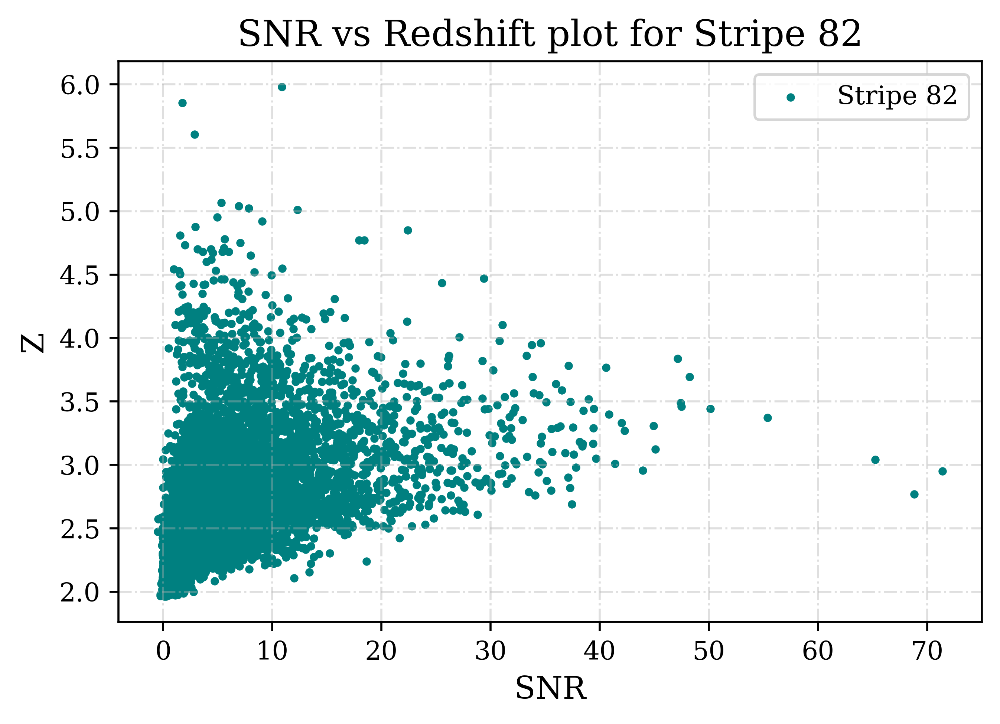

In [61]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'SNR vs Redshift plot for Stripe 82',fontsize=14)
plt.xlabel(r'SNR',fontsize=12)
plt.ylabel(r'Z',fontsize=12)
plt.scatter(hdata['SNR_LYA'][(hdata['SNR_LYA']>-.5 )],hdata['Z'][(hdata['SNR_LYA']>-.5 )], color='teal', s=5, label='Stripe 82')

plt.legend();
plt.show()

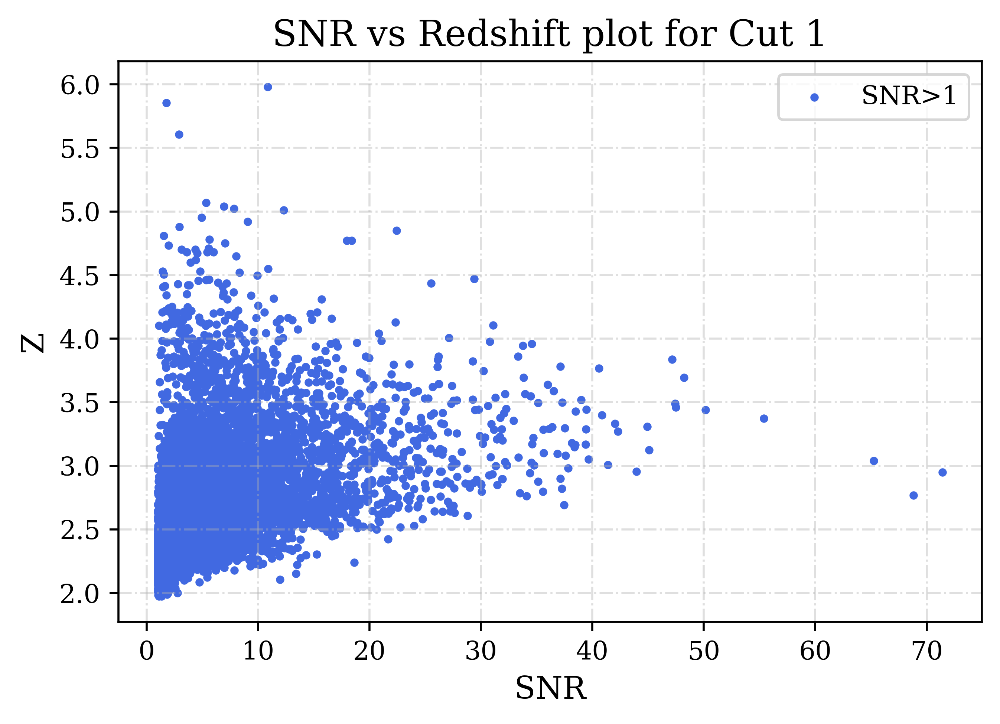

In [62]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'SNR vs Redshift plot for Cut 1',fontsize=14)
plt.xlabel(r'SNR',fontsize=12)
plt.ylabel(r'Z',fontsize=12)
plt.scatter(h_masked['SNR_LYA'],h_masked['Z'], color='royalblue', s=5, label='SNR>1')

plt.legend();
plt.show()

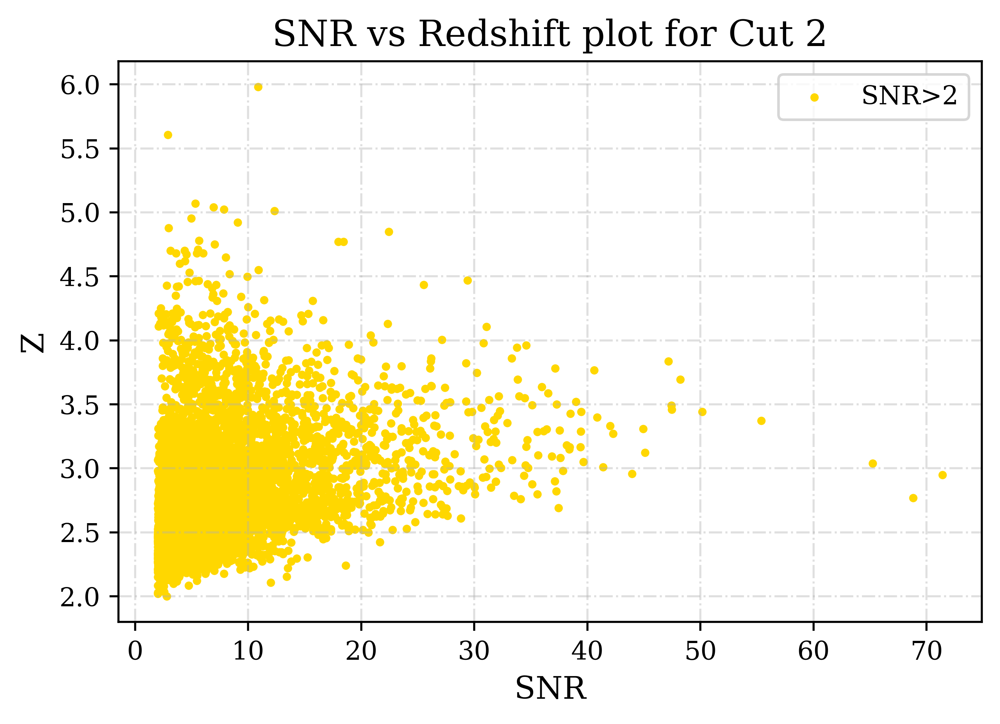

In [63]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'SNR vs Redshift plot for Cut 2',fontsize=14)
plt.xlabel(r'SNR',fontsize=12)
plt.ylabel(r'Z',fontsize=12)
plt.scatter(h_masked2['SNR_LYA'],h_masked2['Z'], color='gold', s=5, label='SNR>2')

plt.legend();
plt.show()

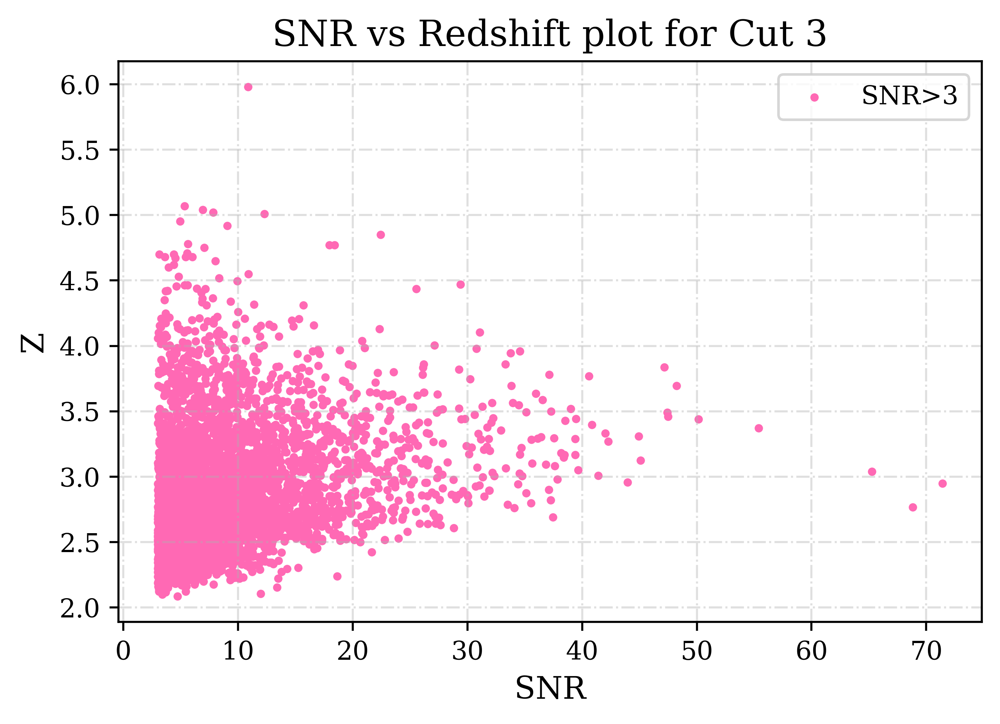

In [64]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'SNR vs Redshift plot for Cut 3',fontsize=14)
plt.xlabel(r'SNR',fontsize=12)
plt.ylabel(r'Z',fontsize=12)
plt.scatter(h_masked3['SNR_LYA'],h_masked3['Z'], color='hotpink', s=5, label='SNR>3')

plt.legend();
plt.show()

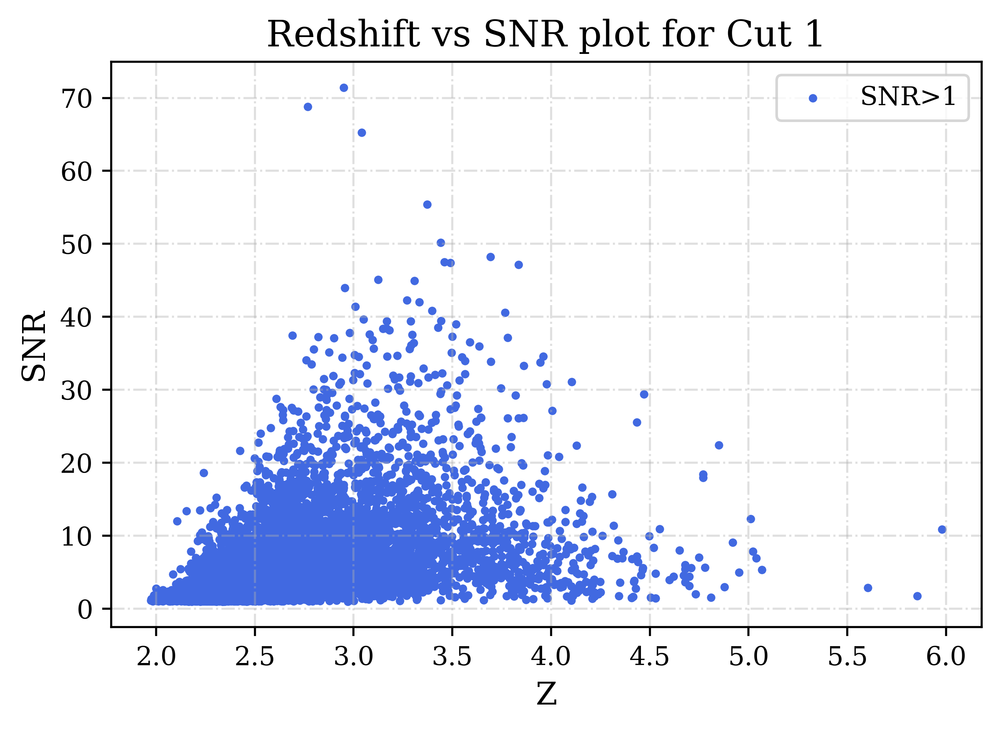

In [65]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Redshift vs SNR plot for Cut 1',fontsize=14)
plt.xlabel(r'Z',fontsize=12)
plt.ylabel(r'SNR',fontsize=12)
plt.scatter(h_masked['Z'],h_masked['SNR_LYA'], color='royalblue', s=5, label='SNR>1')

plt.legend();
plt.show()

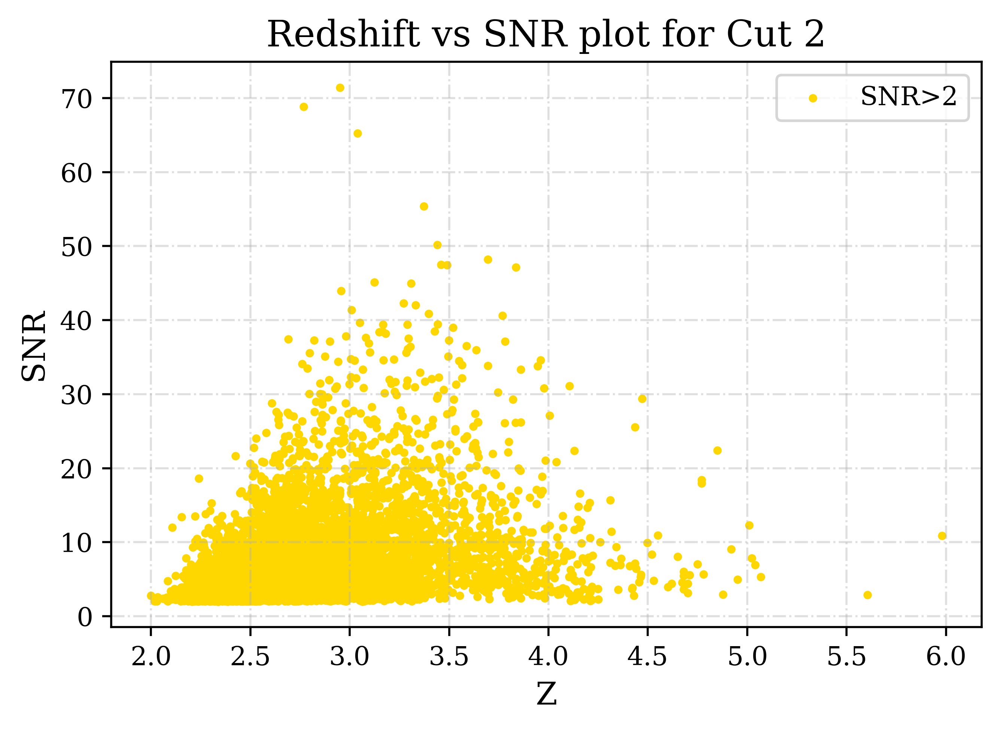

In [66]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Redshift vs SNR plot for Cut 2',fontsize=14)
plt.xlabel(r'Z',fontsize=12)
plt.ylabel(r'SNR',fontsize=12)
plt.scatter(h_masked2['Z'],h_masked2['SNR_LYA'], color='gold', s=5, label='SNR>2')

plt.legend();
plt.show()

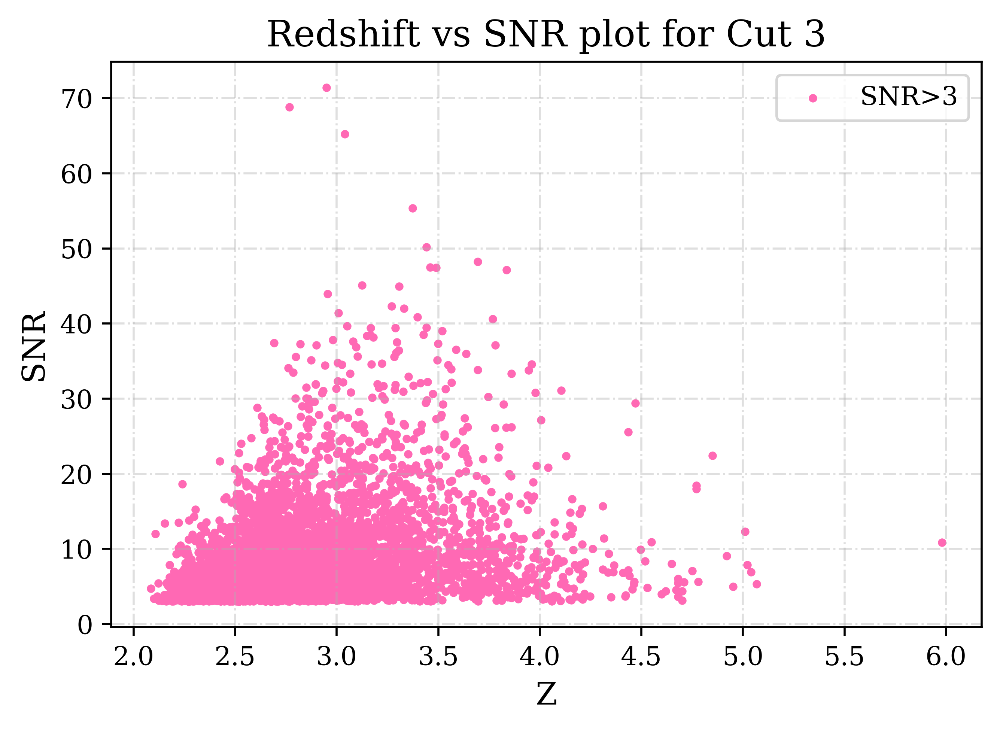

In [67]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Redshift vs SNR plot for Cut 3',fontsize=14)
plt.xlabel(r'Z',fontsize=12)
plt.ylabel(r'SNR',fontsize=12)
plt.scatter(h_masked3['Z'],h_masked3['SNR_LYA'], color='hotpink', s=5, label='SNR>3')

plt.legend();
plt.show()

#### Inside the delta files:

In [68]:
fname='/global/u1/i/ineslie/myhack/Delta_LYA/Delta/'+'delta-89.fits.gz'
fits_read=fits.open(fname)

plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'$\lambda$ vs $\delta$ for one Delta file',fontsize=14)
plt.xlabel(r'RA',fontsize=12)
plt.ylabel(r'DEC',fontsize=12)
plt.scatter(RA,DEC, color='teal', s=5, label='Stripe 82')
#props = dict(boxstyle='round', facecolor='pink', alpha=0.5)
#plt.text(0.55,20 , '$H_{0}=$'+str(H_0*1e6)+'$\, km/sMpc$', bbox=props, fontsize=6)
plt.legend();
plt.show()

In [69]:
Table(fits_read[1].data)
fits_read[1].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / 8-bit bytes                                    
NAXIS   =                    2 / 2-dimensional binary table                     
NAXIS1  =                   32 / width of table in bytes                        
NAXIS2  =                  204 / number of rows in table                        
PCOUNT  =                    0 / size of special data area                      
GCOUNT  =                    1 / one data group (required keyword)              
TFIELDS =                    4 / number of fields in each row                   
TTYPE1  = 'LOGLAM  '           / label for field   1                            
TFORM1  = 'D       '           / data format of field: 8-byte DOUBLE            
TUNIT1  = 'log Angstrom'       / physical unit of field                         
TTYPE2  = 'DELTA   '           / label for field   2                            
TFORM2  = 'D       '        

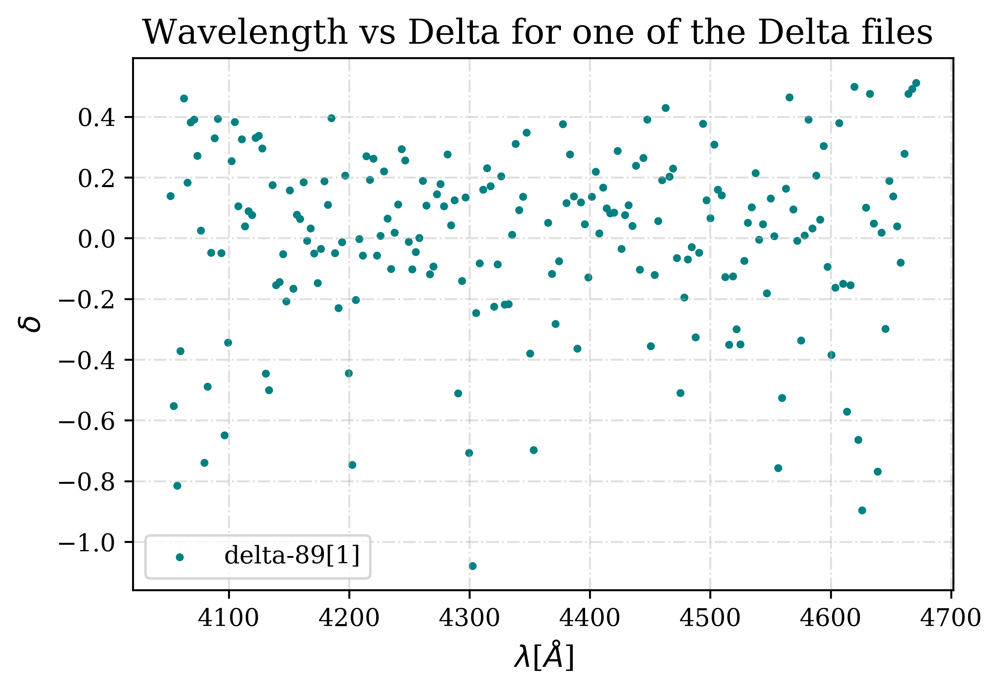

In [70]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Wavelength vs Delta for one of the Delta files ',fontsize=14)
plt.xlabel(r'$\lambda$[${\AA}$]',fontsize=12)
plt.ylabel(r'$\delta$',fontsize=12)
plt.scatter(10**fits_read[1].data['LOGLAM'],fits_read[1].data['DELTA'], color='teal', s=5, label='delta-89[1]')
#props = dict(boxstyle='round', facecolor='pink', alpha=0.5)
#plt.text(0.55,20 , '$H_{0}=$'+str(H_0*1e6)+'$\, km/sMpc$', bbox=props, fontsize=6)
plt.legend();
plt.show()

$$\delta=\frac{F(\lambda)}{\bar{F}}-1$$

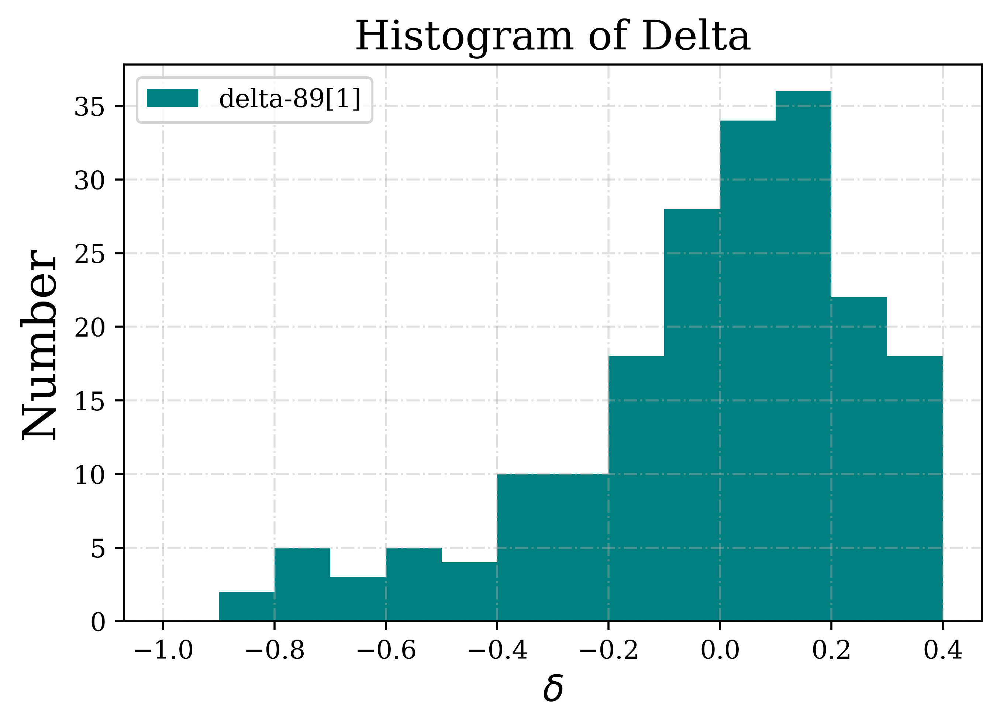

In [71]:
plt.figure()
%matplotlib inline
dpi=500   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Histogram of Delta',fontsize=16)
plt.xlabel(r'$\delta$',fontsize=14)
plt.ylabel(r'Number',fontsize=18)

plt.hist(fits_read[1].data['DELTA'], color='teal',label='delta-89[1]',bins=np.arange(-1,0.5, 0.1))
plt.legend();
plt.show()

#### Arranging the files to calculate the deltas for Cut 1:

#### Inside the delta files created for S82 without any cuts:

In [206]:
delta_names=(72,73,74,87,88,89,102,103,104,105,106,119)
len(delta_names)

12

In [207]:
len(hdata)

28874

In [214]:
delta_read=list()
redshift_read=list()
loglam_read=list()
cont_read=list()
weight_read=list()
thingid_read=list()

In [215]:
for num in delta_names:
    fname='/global/u1/i/ineslie/myhack/Delta_LYA/Delta/'+'delta-'+str(num)+'.fits.gz'
    fits_read=fits.open(fname)
    result = None
    i=1
    while result is None:
        for i in range(1,9999):
            try:
                result = fits_read[i].data
                pos=len(delta_read) #position to insert the new data to the existing list
                redshift_read[pos:pos] = fits_read[i].header['Z']*np.ones(len(fits_read[i].data))
                thingid_read[pos:pos] = fits_read[i].header['THING_ID']*np.ones(len(fits_read[i].data))
                delta_read[pos:pos]=np.array(Table(result)['DELTA'])
                loglam_read[pos:pos]=np.array(Table(result)['LOGLAM'])
                weight_read[pos:pos]=np.array(Table(result)['WEIGHT'])
                cont_read[pos:pos]=np.array(Table(result)['CONT'])
            except IndexError:
                print("An exception occurred")
                print(i-1)
                break
  

An exception occurred
70
An exception occurred
77
An exception occurred
27
An exception occurred
44
An exception occurred
2028
An exception occurred
2090
An exception occurred
1269
An exception occurred
1291
An exception occurred
78
An exception occurred
80
An exception occurred
32
An exception occurred
38


In [216]:
len(loglam_read)

1191010

In [217]:
fits_read[5].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / 8-bit bytes                                    
NAXIS   =                    2 / 2-dimensional binary table                     
NAXIS1  =                   32 / width of table in bytes                        
NAXIS2  =                  107 / number of rows in table                        
PCOUNT  =                    0 / size of special data area                      
GCOUNT  =                    1 / one data group (required keyword)              
TFIELDS =                    4 / number of fields in each row                   
TTYPE1  = 'LOGLAM  '           / label for field   1                            
TFORM1  = 'D       '           / data format of field: 8-byte DOUBLE            
TUNIT1  = 'log Angstrom'       / physical unit of field                         
TTYPE2  = 'DELTA   '           / label for field   2                            
TFORM2  = 'D       '        

In [218]:
70+77+27+44+2028+2090+1269+1291+78+80+32+38

7124

In [219]:
len(hdata)

28874

In [220]:
S82_result = Table()

In [221]:
Z_read=Table.Column(redshift_read, name='Z')
DELTA_read=Table.Column(delta_read, name='DELTA')
LOGLAM_read=Table.Column(loglam_read, name='LOGLAM')
WEIGHT_read=Table.Column(weight_read, name='WEIGHT')
CONT_read=Table.Column(cont_read, name='CONT')
THING_ID_read=Table.Column(thingid_read, name='THING_ID')

In [222]:
S82_result.add_column(Z_read)
S82_result.add_column(DELTA_read)
S82_result.add_column(LOGLAM_read)
S82_result.add_column(WEIGHT_read)
S82_result.add_column(CONT_read)
S82_result.add_column(THING_ID_read)

In [223]:
S82_result

Z,DELTA,LOGLAM,WEIGHT,CONT,THING_ID
float64,float64,float64,float64,float64,float64
2.2711024,6.718073868136246,3.5572025007672874,0.023972190816346124,0.5472461950880371,107544612.0
2.2711024,-0.768015431438086,3.557502500767287,0.09475461002068043,0.5467008560156057,107544612.0
2.2711024,-2.204037535530211,3.5578025007672873,0.18014183701682734,0.5474892629568981,107544612.0
2.2711024,-2.0686951712944346,3.558102500767287,0.2224068946937606,0.5491530578653094,107544612.0
2.2711024,6.511293560196418,3.5584025007672873,0.2056538098916137,0.5513209060886378,107544612.0
2.2711024,-0.27650082131151377,3.5587025007672874,0.21482028057479013,0.5513536388539214,107544612.0
2.2711024,-0.7300427265754406,3.559002500767287,0.2512762303309801,0.5466387369485287,107544612.0
2.2711024,-3.3881047032642533,3.5593025007672874,0.276422413690192,0.5464543518552571,107544612.0
2.2711024,-1.67232597861637,3.559602500767287,0.2661311187699446,0.5475954832746588,107544612.0


In [225]:
len(np.unique(S82_result['THING_ID']))

7124

In [227]:
len(np.unique(hdata['THING_ID']))

21436

In [228]:
len(hdata)

28874

In [234]:
len(np.unique(S82_result['Z']))

2364

In [235]:
len(np.unique(hdata['Z']))

16751

In [237]:
len(np.unique(hdata['RA']))

28869

In [239]:
len(np.unique(hdata['DEC']))

28861

In [242]:
len(S82_result)

1191010

In [167]:
LAMBDA_obs=10**(S82_result['LOGLAM']) #observed wavelength
LAMBDA_rf=LAMBDA_obs/(S82_result['Z']+1) #wavelength in the rest frame

In [168]:
LAMBDA_obs=Table.Column(LAMBDA_obs, name='LAMBDA_OBS')
LAMBDA_rf=Table.Column(LAMBDA_rf, name='LAMBDA_RF')

In [169]:
S82_result.add_column(LAMBDA_obs)
S82_result.add_column(LAMBDA_rf)

In [170]:
S82_result

Z,DELTA,LOGLAM,WEIGHT,CONT,LAMBDA_OBS,LAMBDA_RF
float64,float64,float64,float64,float64,float64,float64
2.2711024,6.718073868136246,3.5572025007672874,0.023972190816346124,0.5472461950880371,3607.468111211325,1102.82946544606
2.2711024,-0.768015431438086,3.557502500767287,0.09475461002068043,0.5467008560156057,3609.960922787712,1103.5915362318563
2.2711024,-2.204037535530211,3.5578025007672873,0.18014183701682734,0.5474892629568981,3612.4554569322218,1104.3541336193637
2.2711024,-2.0686951712944346,3.558102500767287,0.2224068946937606,0.5491530578653094,3614.9517148351642,1105.1172579724696
2.2711024,6.511293560196418,3.5584025007672873,0.2056538098916137,0.5513209060886378,3617.449697687689,1105.8809096553164
2.2711024,-0.27650082131151377,3.5587025007672874,0.21482028057479013,0.5513536388539214,3619.949406681757,1106.6450890322958
2.2711024,-0.7300427265754406,3.559002500767287,0.2512762303309801,0.5466387369485287,3622.4508430101528,1107.409796468051
2.2711024,-3.3881047032642533,3.5593025007672874,0.276422413690192,0.5464543518552571,3624.954007866496,1108.1750323274794
2.2711024,-1.67232597861637,3.559602500767287,0.2661311187699446,0.5475954832746588,3627.4589024452166,1108.9407969757278


In [171]:
mean_delta_obs=list()

In [172]:
for lambda_i in np.unique(S82_result['LAMBDA_OBS']):
    mask = (S82_result['LAMBDA_OBS']==lambda_i)
    mean_delta_obs.append(np.mean(S82_result['DELTA'][mask]))

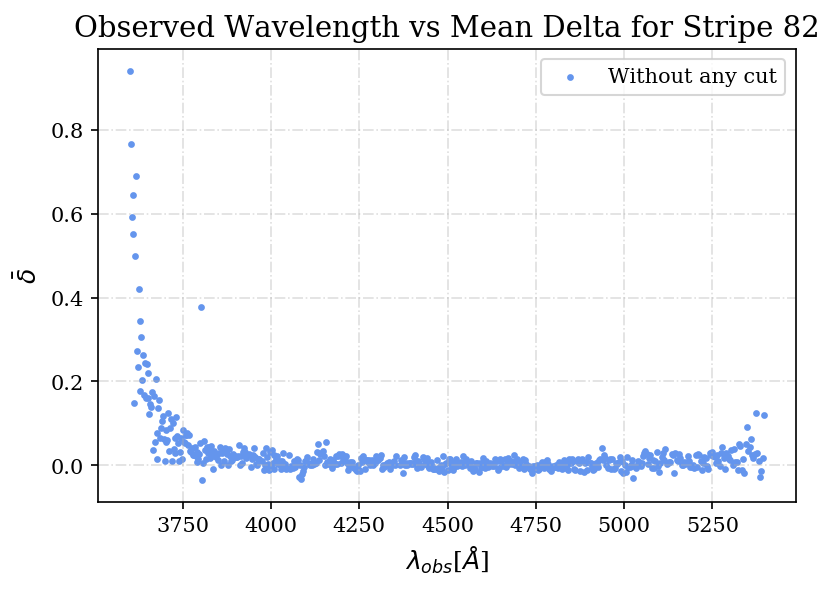

In [173]:
plt.figure()
%matplotlib inline
dpi=150   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Observed Wavelength vs Mean Delta for Stripe 82',fontsize=14)
plt.xlabel(r'$\lambda_{obs}$[${\AA}$]',fontsize=12)
plt.ylabel(r'$\bar{\delta}$',fontsize=12)
plt.scatter(np.unique(S82_result['LAMBDA_OBS']),mean_delta_obs, color='cornflowerblue', s=5, label='Without any cut')

plt.legend();
plt.show()

In [174]:
mean_delta_rf=list()

In [175]:
for lambda_j in np.unique(S82_result['LAMBDA_RF']):
    mask = (S82_result['LAMBDA_RF']==lambda_j)
    mean_delta_rf.append(np.mean(S82_result['DELTA'][mask]))

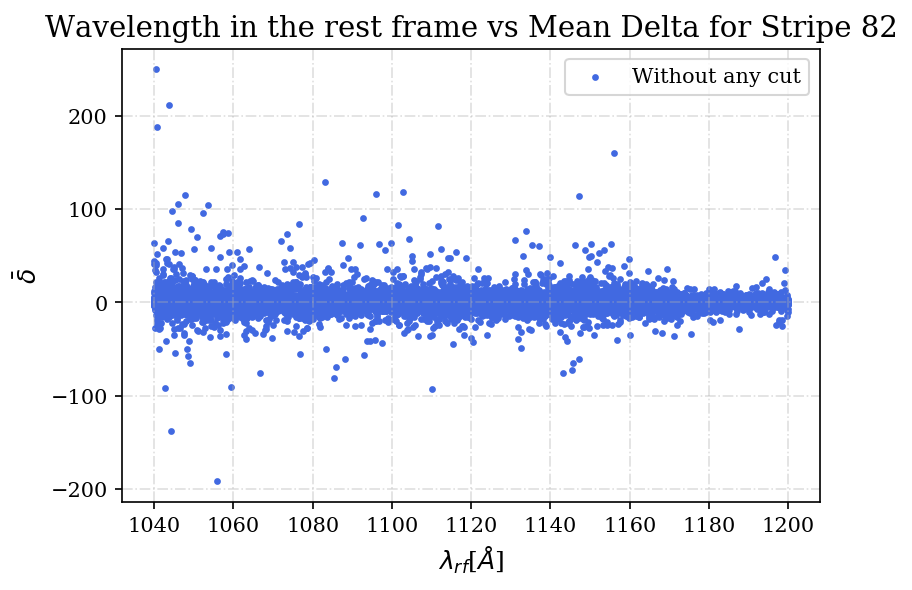

In [176]:
plt.figure()
%matplotlib inline
dpi=150   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Wavelength in the rest frame vs Mean Delta for Stripe 82',fontsize=14)
plt.xlabel(r'$\lambda_{rf}$[${\AA}$]',fontsize=12)
plt.ylabel(r'$\bar{\delta}$',fontsize=12)
plt.scatter(np.unique(S82_result['LAMBDA_RF']),mean_delta_rf, color='royalblue', s=5, label='Without any cut')

plt.legend();
plt.show()

In [177]:
mean_deltaobs=list()

In [178]:
for i in range(5500-3600):
    mask=(np.logical_and(S82_result['LAMBDA_OBS']>=3600+i, S82_result['LAMBDA_OBS']<3601+i))
    mean_deltaobs.append(np.mean(S82_result['DELTA'][mask]))

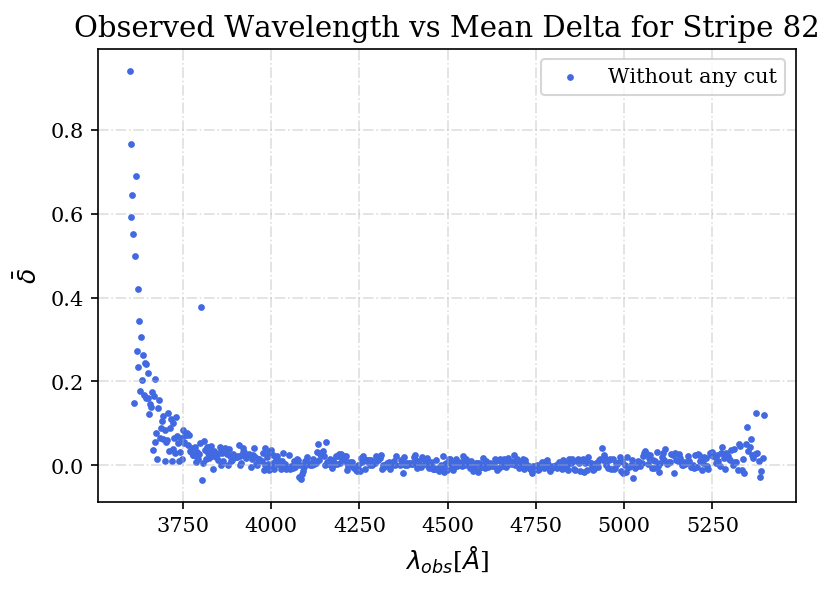

In [179]:
plt.figure()
%matplotlib inline
dpi=150   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Observed Wavelength vs Mean Delta for Stripe 82',fontsize=14)
plt.xlabel(r'$\lambda_{obs}$[${\AA}$]',fontsize=12)
plt.ylabel(r'$\bar{\delta}$',fontsize=12)
plt.scatter(list(range(3600,5500)),mean_deltaobs, color='royalblue', s=5, label='Without any cut')

plt.legend();
plt.show()

In [180]:
mean_deltarf=list()

In [181]:
for i in range(1200-1040):
    mask=(np.logical_and(S82_result['LAMBDA_RF']>1040+i, S82_result['LAMBDA_RF']<1041+i))
    mean_deltarf.append(np.mean(S82_result['DELTA'][mask]))

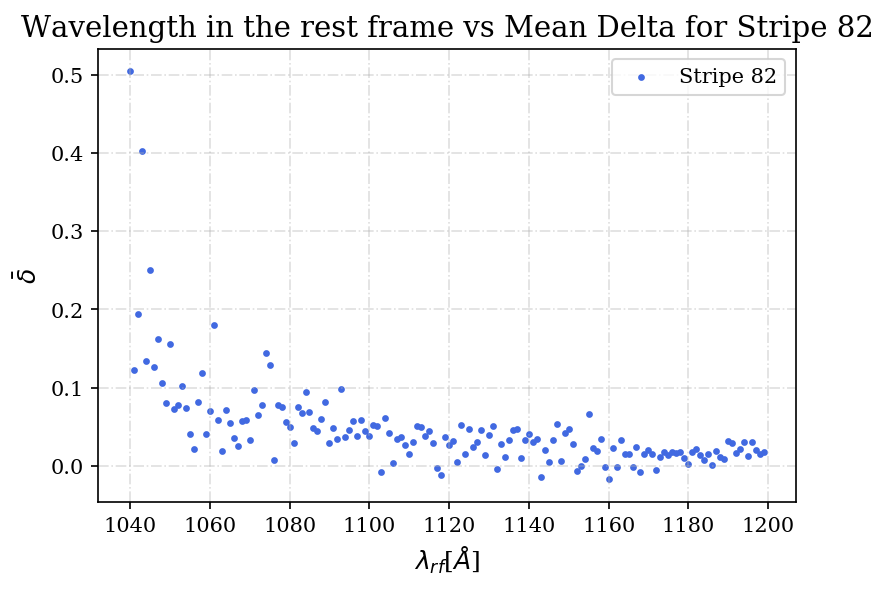

In [182]:
plt.figure()
%matplotlib inline
dpi=150   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Wavelength in the rest frame vs Mean Delta for Stripe 82',fontsize=14)
plt.xlabel(r'$\lambda_{rf}$[${\AA}$]',fontsize=12)
plt.ylabel(r'$\bar{\delta}$',fontsize=12)
plt.scatter(list(range(1040,1200)),mean_deltarf, color='royalblue', s=5, label='Stripe 82')

plt.legend();
plt.show()

#### Inside the delta files created for S82 with only 1st HDU:

In [185]:
len(hdata)

28874

In [186]:
delta_read=list()
redshift_read=list()
loglam_read=list()
cont_read=list()
weight_read=list()

In [187]:
for num in delta_names:
    fname='/global/u1/i/ineslie/myhack/Delta_LYA/Delta/'+'delta-'+str(num)+'.fits.gz'
    fits_read=fits.open(fname)
    i=1
    result = fits_read[i].data
    pos=len(delta_read) #position to insert the new data to the existing list
    redshift_read[pos:pos] = fits_read[i].header['Z']*np.ones(len(fits_read[i].data))
    delta_read[pos:pos]=np.array(Table(result)['DELTA'])
    loglam_read[pos:pos]=np.array(Table(result)['LOGLAM'])
    weight_read[pos:pos]=np.array(Table(result)['WEIGHT'])
    cont_read[pos:pos]=np.array(Table(result)['CONT'])
  

In [189]:
S82_result = Table()

In [190]:
Z_read=Table.Column(redshift_read, name='Z')
DELTA_read=Table.Column(delta_read, name='DELTA')
LOGLAM_read=Table.Column(loglam_read, name='LOGLAM')
WEIGHT_read=Table.Column(weight_read, name='WEIGHT')
CONT_read=Table.Column(cont_read, name='CONT')

In [191]:
S82_result.add_column(Z_read)
S82_result.add_column(DELTA_read)
S82_result.add_column(LOGLAM_read)
S82_result.add_column(WEIGHT_read)
S82_result.add_column(CONT_read)

In [192]:
S82_result

Z,DELTA,LOGLAM,WEIGHT,CONT
float64,float64,float64,float64,float64
2.2711024,6.718073868136246,3.5572025007672874,0.023972190816346124,0.5472461950880371
2.2711024,-0.768015431438086,3.557502500767287,0.09475461002068043,0.5467008560156057
2.2711024,-2.204037535530211,3.5578025007672873,0.18014183701682734,0.5474892629568981
2.2711024,-2.0686951712944346,3.558102500767287,0.2224068946937606,0.5491530578653094
2.2711024,6.511293560196418,3.5584025007672873,0.2056538098916137,0.5513209060886378
2.2711024,-0.27650082131151377,3.5587025007672874,0.21482028057479013,0.5513536388539214
2.2711024,-0.7300427265754406,3.559002500767287,0.2512762303309801,0.5466387369485287
2.2711024,-3.3881047032642533,3.5593025007672874,0.276422413690192,0.5464543518552571
2.2711024,-1.67232597861637,3.559602500767287,0.2661311187699446,0.5475954832746588


In [193]:
len(delta_names)

12

In [198]:
fits_read[0].data

In [199]:
num

119

In [200]:
fits_read=fits.open(fname)

In [201]:
fits_read

[<astropy.io.fits.hdu.image.PrimaryHDU object at 0x2aaadd0ae590>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x2aaadd0b8050>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x2aaadd0b8650>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x2aaadff3db90>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x2aaaf3075450>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x2aaadcc684d0>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x2aaaf448de50>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x2aaadb3c9490>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x2aaadffa6dd0>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x2aaadcb66810>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x2aaadc991b90>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x2aaadcb2ced0>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x2aaadd1ec290>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x2aaaf3053710>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x2aaadffb9e50>, <astropy.i

In [203]:
fits_read[0].header

SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                   16 / number of bits per data pixel                  
NAXIS   =                    0 / number of data axes                            
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 

In [204]:
fits_read[1].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / 8-bit bytes                                    
NAXIS   =                    2 / 2-dimensional binary table                     
NAXIS1  =                   32 / width of table in bytes                        
NAXIS2  =                  203 / number of rows in table                        
PCOUNT  =                    0 / size of special data area                      
GCOUNT  =                    1 / one data group (required keyword)              
TFIELDS =                    4 / number of fields in each row                   
TTYPE1  = 'LOGLAM  '           / label for field   1                            
TFORM1  = 'D       '           / data format of field: 8-byte DOUBLE            
TUNIT1  = 'log Angstrom'       / physical unit of field                         
TTYPE2  = 'DELTA   '           / label for field   2                            
TFORM2  = 'D       '        

In [205]:
fits_read[2].header

XTENSION= 'BINTABLE'           / binary table extension                         
BITPIX  =                    8 / 8-bit bytes                                    
NAXIS   =                    2 / 2-dimensional binary table                     
NAXIS1  =                   32 / width of table in bytes                        
NAXIS2  =                  208 / number of rows in table                        
PCOUNT  =                    0 / size of special data area                      
GCOUNT  =                    1 / one data group (required keyword)              
TFIELDS =                    4 / number of fields in each row                   
TTYPE1  = 'LOGLAM  '           / label for field   1                            
TFORM1  = 'D       '           / data format of field: 8-byte DOUBLE            
TUNIT1  = 'log Angstrom'       / physical unit of field                         
TTYPE2  = 'DELTA   '           / label for field   2                            
TFORM2  = 'D       '        

Each HDU has the delta data for one unique quasar. 

#### Inside the delta files created for Cut 1:

In [72]:
delta_names=(72,73,74,87,88,89,102,103,104,105,106,119)
len(delta_names)

12

In [73]:
delta_read=list()
redshift_read=list()
loglam_read=list()
cont_read=list()
weight_read=list()

In [74]:
for num in delta_names:
    fname='/global/u1/i/ineslie/myhack/Delta_LYA/Delta/'+'Cut1/'+'delta-'+str(num)+'.fits.gz'
    fits_read=fits.open(fname)
    result = None
    i=1
    while result is None:
        for i in range(1,9999):
            try:
                result = fits_read[i].data
                pos=len(delta_read) #position to insert the new data to the existing list
                redshift_read[pos:pos] = fits_read[i].header['Z']*np.ones(len(fits_read[i].data))
                delta_read[pos:pos]=np.array(Table(result)['DELTA'])
                loglam_read[pos:pos]=np.array(Table(result)['LOGLAM'])
                weight_read[pos:pos]=np.array(Table(result)['WEIGHT'])
                cont_read[pos:pos]=np.array(Table(result)['CONT'])
            except IndexError:
                print("An exception occurred")
                break
    

An exception occurred
An exception occurred
An exception occurred
An exception occurred
An exception occurred
An exception occurred
An exception occurred
An exception occurred
An exception occurred
An exception occurred
An exception occurred
An exception occurred


In [151]:
Table(fits_read[1].data)

LOGLAM,DELTA,WEIGHT,CONT
float64,float64,float64,float64
3.604002500767287,0.8247965995452979,3.445875330792822,0.42284378835633935
3.6043025007672873,0.47230567454326944,3.1812631768224993,0.40957848162854277
3.604602500767287,-0.1497657577667436,3.2877964656010588,0.40229090764921116
3.6049025007672872,-0.14155899469809996,3.535008452450012,0.40133999147436056
3.6052025007672874,0.14969456535665415,3.3695246014293163,0.38826092981996196
3.605502500767287,0.22703494768721622,3.372572375878637,0.3791567283035078
3.6058025007672874,0.1795826879407234,3.4362189745747176,0.379499129751891
3.606102500767287,0.7988898425827751,3.1278073723354423,0.37396207283875044
3.6064025007672873,-0.6352735606377136,3.3620684389475843,0.3650896265056518


In [75]:
len(loglam_read)

1049945

In [76]:
Cut1_result = Table()

In [77]:
Z_read=Table.Column(redshift_read, name='Z')
DELTA_read=Table.Column(delta_read, name='DELTA')
LOGLAM_read=Table.Column(loglam_read, name='LOGLAM')
WEIGHT_read=Table.Column(weight_read, name='WEIGHT')
CONT_read=Table.Column(cont_read, name='CONT')

In [78]:
Cut1_result.add_column(Z_read)
Cut1_result.add_column(DELTA_read)
Cut1_result.add_column(LOGLAM_read)
Cut1_result.add_column(WEIGHT_read)
Cut1_result.add_column(CONT_read)

In [79]:
Cut1_result

Z,DELTA,LOGLAM,WEIGHT,CONT
float64,float64,float64,float64,float64
2.2711024,6.73232788975932,3.5572025007672874,0.023799207986794035,0.5456243904232738
2.2711024,-0.7666571541511119,3.557502500767287,0.0933273850484262,0.5450599676300627
2.2711024,-2.210741161812853,3.5578025007672873,0.17753854696057333,0.5456476635197222
2.2711024,-2.071070581242541,3.558102500767287,0.22065135907340663,0.5474920271416583
2.2711024,6.578201638230056,3.5584025007672873,0.20135558894119399,0.5493796543311595
2.2711024,-0.27525849665220126,3.5587025007672874,0.21333750443110247,0.5502108450292514
2.2711024,-0.7299774348867384,3.559002500767287,0.25027403560841127,0.5448674564199512
2.2711024,-3.4030840309727997,3.5593025007672874,0.27206579024256505,0.5448308588072073
2.2711024,-1.6720697396410649,3.559602500767287,0.2653975022721682,0.5455722356774013


In [80]:
LAMBDA_obs=10**(Cut1_result['LOGLAM']) #observed wavelength
LAMBDA_rf=LAMBDA_obs/(Cut1_result['Z']+1) #wavelength in the rest frame

In [81]:
LAMBDA_obs=Table.Column(LAMBDA_obs, name='LAMBDA_OBS')
LAMBDA_rf=Table.Column(LAMBDA_rf, name='LAMBDA_RF')

In [82]:
Cut1_result.add_column(LAMBDA_obs)
Cut1_result.add_column(LAMBDA_rf)

In [83]:
Cut1_result

Z,DELTA,LOGLAM,WEIGHT,CONT,LAMBDA_OBS,LAMBDA_RF
float64,float64,float64,float64,float64,float64,float64
2.2711024,6.73232788975932,3.5572025007672874,0.023799207986794035,0.5456243904232738,3607.468111211325,1102.82946544606
2.2711024,-0.7666571541511119,3.557502500767287,0.0933273850484262,0.5450599676300627,3609.960922787712,1103.5915362318563
2.2711024,-2.210741161812853,3.5578025007672873,0.17753854696057333,0.5456476635197222,3612.4554569322218,1104.3541336193637
2.2711024,-2.071070581242541,3.558102500767287,0.22065135907340663,0.5474920271416583,3614.9517148351642,1105.1172579724696
2.2711024,6.578201638230056,3.5584025007672873,0.20135558894119399,0.5493796543311595,3617.449697687689,1105.8809096553164
2.2711024,-0.27525849665220126,3.5587025007672874,0.21333750443110247,0.5502108450292514,3619.949406681757,1106.6450890322958
2.2711024,-0.7299774348867384,3.559002500767287,0.25027403560841127,0.5448674564199512,3622.4508430101528,1107.409796468051
2.2711024,-3.4030840309727997,3.5593025007672874,0.27206579024256505,0.5448308588072073,3624.954007866496,1108.1750323274794
2.2711024,-1.6720697396410649,3.559602500767287,0.2653975022721682,0.5455722356774013,3627.4589024452166,1108.9407969757278


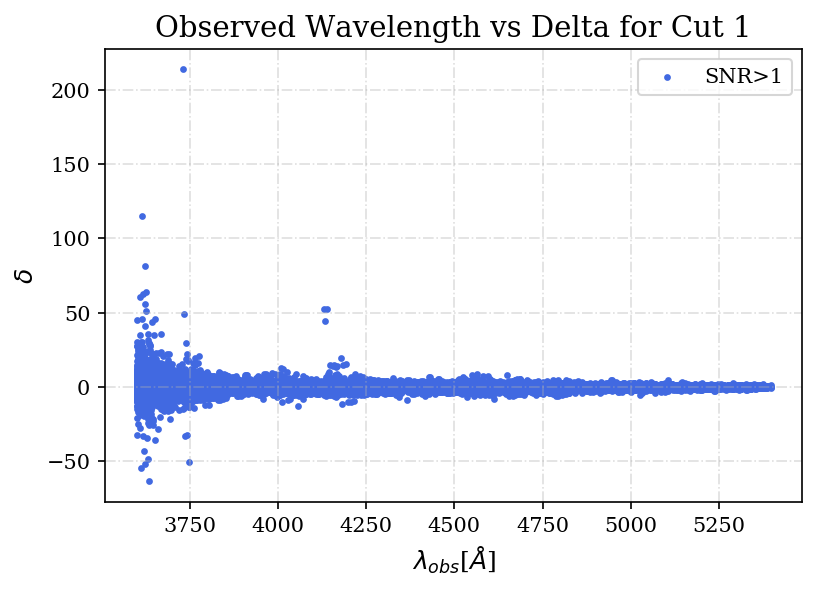

In [84]:
plt.figure()
%matplotlib inline
dpi=150   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Observed Wavelength vs Delta for Cut 1',fontsize=14)
plt.xlabel(r'$\lambda_{obs}$[${\AA}$]',fontsize=12)
plt.ylabel(r'$\delta$',fontsize=12)
plt.scatter(Cut1_result['LAMBDA_OBS'],Cut1_result['DELTA'], color='royalblue', s=5, label='SNR>1')

plt.legend();
plt.show()

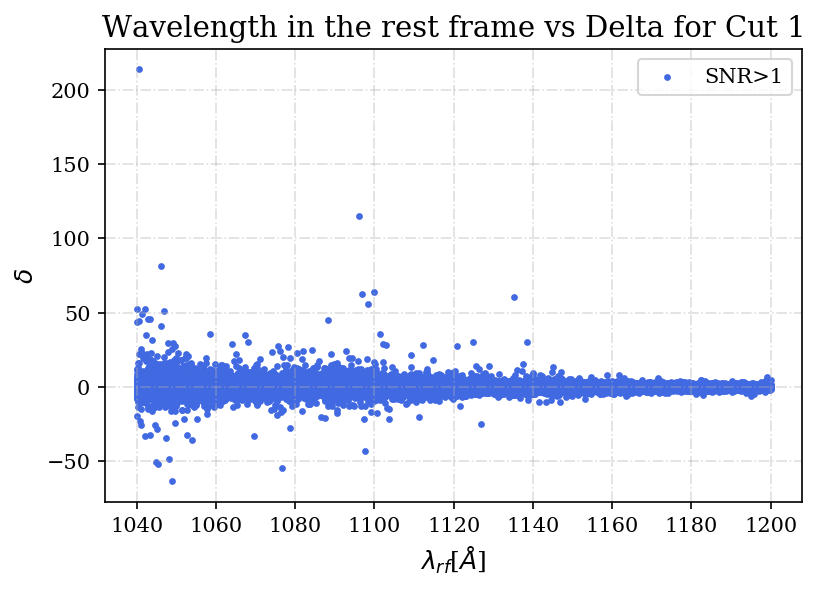

In [85]:
plt.figure()
%matplotlib inline
dpi=150   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Wavelength in the rest frame vs Delta for Cut 1',fontsize=14)
plt.xlabel(r'$\lambda_{rf}$[${\AA}$]',fontsize=12)
plt.ylabel(r'$\delta$',fontsize=12)
plt.scatter(Cut1_result['LAMBDA_RF'],Cut1_result['DELTA'], color='royalblue', s=5, label='SNR>1')

plt.legend();
plt.show()

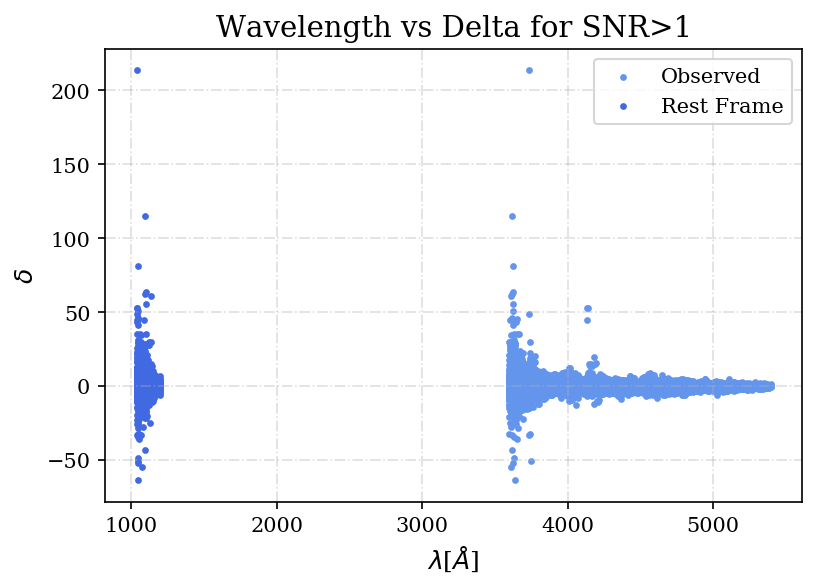

In [86]:
plt.figure()
%matplotlib inline
dpi=150   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Wavelength vs Delta for SNR>1',fontsize=14)
plt.xlabel(r'$\lambda$[${\AA}$]',fontsize=12)
plt.ylabel(r'$\delta$',fontsize=12)
plt.scatter(Cut1_result['LAMBDA_OBS'],Cut1_result['DELTA'], color='cornflowerblue', s=5, label='Observed')
plt.scatter(Cut1_result['LAMBDA_RF'],Cut1_result['DELTA'], color='royalblue', s=5, label='Rest Frame')

plt.legend();
plt.show()

$$\delta=\frac{F(\lambda)}{\bar{F}}-1$$

In [87]:
len(np.unique(Cut1_result['LAMBDA_OBS']))

579

In [88]:
len(np.unique(Cut1_result['LAMBDA_RF']))

353459

In [89]:
mean_delta_obs=list()

In [90]:
for lambda_i in np.unique(Cut1_result['LAMBDA_OBS']):
    mask = (Cut1_result['LAMBDA_OBS']==lambda_i)
    mean_delta_obs.append(np.mean(Cut1_result['DELTA'][mask]))

In [92]:
len(mean_delta_obs)    

579

In [93]:
mean_delta_rf=list()

In [94]:
for lambda_j in np.unique(Cut1_result['LAMBDA_RF']):
    mask = (Cut1_result['LAMBDA_RF']==lambda_j)
    mean_delta_rf.append(np.mean(Cut1_result['DELTA'][mask]))

In [95]:
len(mean_delta_rf)  

353459

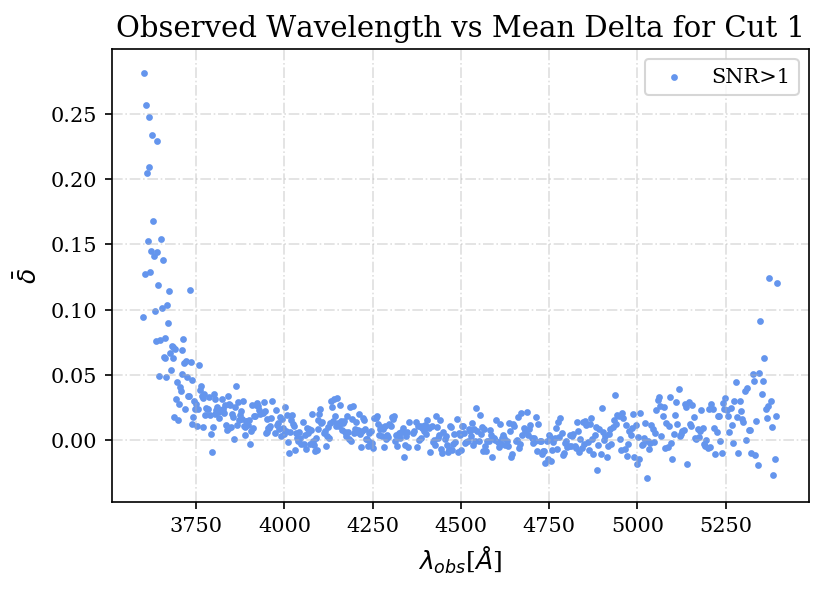

In [99]:
plt.figure()
%matplotlib inline
dpi=150   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Observed Wavelength vs Mean Delta for Cut 1',fontsize=14)
plt.xlabel(r'$\lambda_{obs}$[${\AA}$]',fontsize=12)
plt.ylabel(r'$\bar{\delta}$',fontsize=12)
plt.scatter(np.unique(Cut1_result['LAMBDA_OBS']),mean_delta_obs, color='cornflowerblue', s=5, label='SNR>1')

plt.legend();
plt.show()

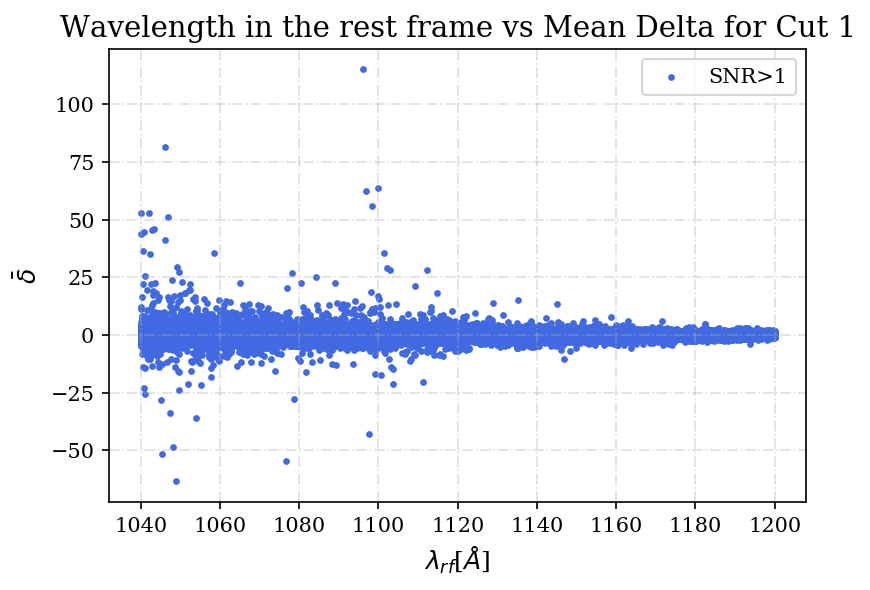

In [100]:
plt.figure()
%matplotlib inline
dpi=150   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Wavelength in the rest frame vs Mean Delta for Cut 1',fontsize=14)
plt.xlabel(r'$\lambda_{rf}$[${\AA}$]',fontsize=12)
plt.ylabel(r'$\bar{\delta}$',fontsize=12)
plt.scatter(np.unique(Cut1_result['LAMBDA_RF']),mean_delta_rf, color='royalblue', s=5, label='SNR>1')

plt.legend();
plt.show()

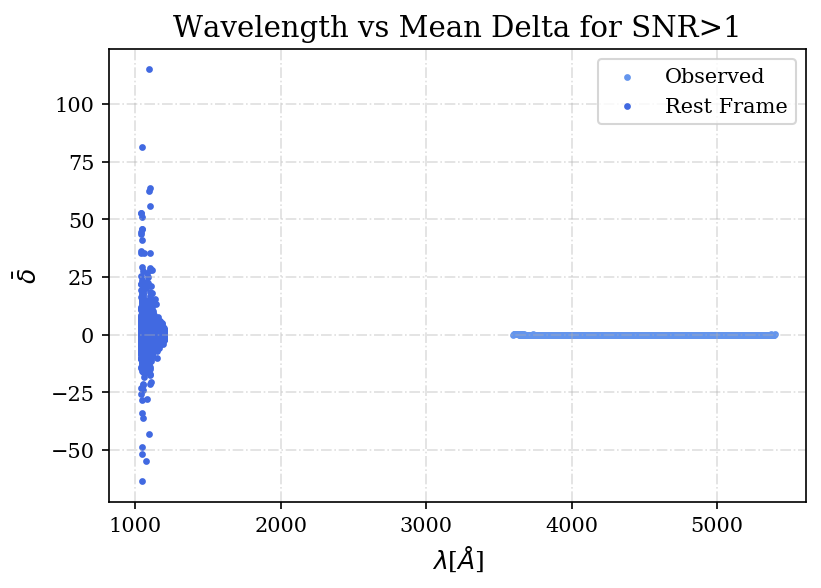

In [101]:
plt.figure()
%matplotlib inline
dpi=150   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Wavelength vs Mean Delta for SNR>1',fontsize=14)
plt.xlabel(r'$\lambda$[${\AA}$]',fontsize=12)
plt.ylabel(r'$\bar{\delta}$',fontsize=12)
plt.scatter(np.unique(Cut1_result['LAMBDA_OBS']),mean_delta_obs, color='cornflowerblue', s=5, label='Observed')
plt.scatter(np.unique(Cut1_result['LAMBDA_RF']),mean_delta_rf, color='royalblue', s=5, label='Rest Frame')

plt.legend();
plt.show()

$$\delta=\frac{F(\lambda)}{\bar{F}}-1$$
For error bars, should I use scipy.stats.sem?

In [137]:
mean_deltarf=list()

In [138]:
for i in range(1200-1040):
    mask=(np.logical_and(Cut1_result['LAMBDA_RF']>1040+i, Cut1_result['LAMBDA_RF']<1041+i))
    mean_deltarf.append(np.mean(Cut1_result['DELTA'][mask]))

In [139]:
len(mean_deltarf)

160

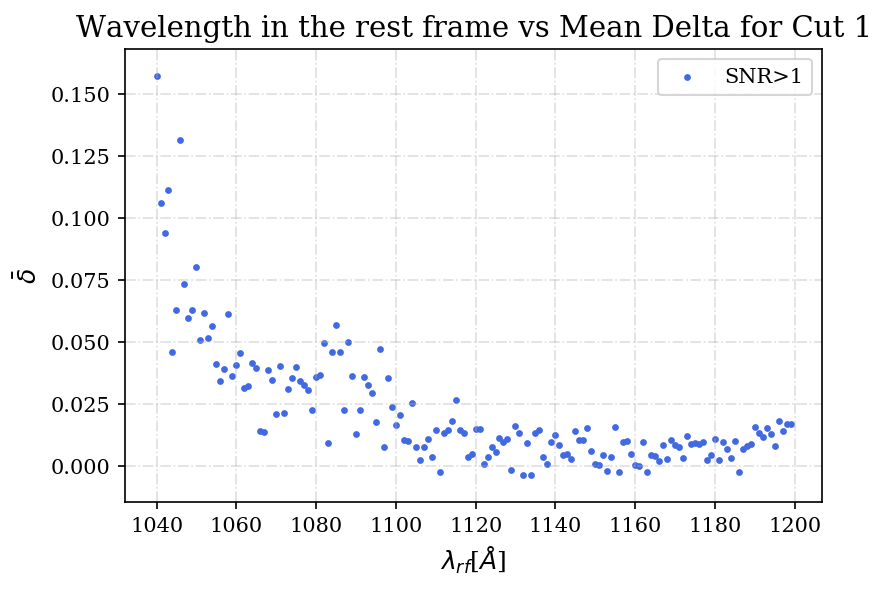

In [140]:
plt.figure()
%matplotlib inline
dpi=150   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Wavelength in the rest frame vs Mean Delta for Cut 1',fontsize=14)
plt.xlabel(r'$\lambda_{rf}$[${\AA}$]',fontsize=12)
plt.ylabel(r'$\bar{\delta}$',fontsize=12)
plt.scatter(list(range(1040,1200)),mean_deltarf, color='royalblue', s=5, label='SNR>1')

plt.legend();
plt.show()

In [141]:
mean_deltaobs=list()

In [142]:
for i in range(5500-3600):
    mask=(np.logical_and(Cut1_result['LAMBDA_OBS']>=3600+i, Cut1_result['LAMBDA_OBS']<3601+i))
    mean_deltaobs.append(np.mean(Cut1_result['DELTA'][mask]))

In [143]:
len(mean_deltaobs)

1900

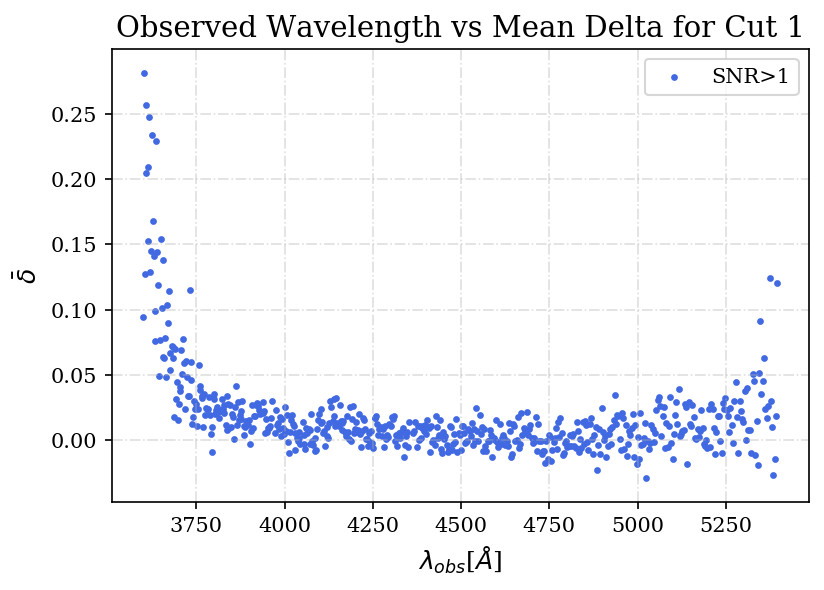

In [144]:
plt.figure()
%matplotlib inline
dpi=150   #to make the plot bigger 
mpl.rcParams['figure.dpi']= dpi
plt.rc('text', usetex=False)
plt.rc('font', family='serif')

plt.grid(True,ls='-.',alpha=.4)
plt.title(r'Observed Wavelength vs Mean Delta for Cut 1',fontsize=14)
plt.xlabel(r'$\lambda_{obs}$[${\AA}$]',fontsize=12)
plt.ylabel(r'$\bar{\delta}$',fontsize=12)
plt.scatter(list(range(3600,5500)),mean_deltaobs, color='royalblue', s=5, label='SNR>1')

plt.legend();
plt.show()

In [145]:
max(Cut1_result['LAMBDA_RF'])

1199.9974739664847

In [146]:
min(Cut1_result['LAMBDA_RF'])

1040.0000041539902

In [147]:
max(Cut1_result['LAMBDA_OBS'])

5396.379710803943

In [148]:
min(Cut1_result['LAMBDA_OBS'])

3600.0

#### For other cuts:

Before moving with the other cuts, I will try to have the deltas for cut1.